# Currency Momentum Effects and FX Trading Strategies

## Project Overview
This project investigates **momentum effects in foreign exchange (FX) markets** and evaluates whether simple, systematic momentum-based strategies generate economically and statistically significant returns.

The analysis is conducted from the perspective of a **systematic investor**, combining:
- Financial theory (momentum and carry effects),
- Empirical asset pricing techniques,
- Practical portfolio construction considerations.

The project is designed to mirror the workflow used in **quantitative research or systematic trading roles**, from data preparation to strategy evaluation.

---

## Key Research Questions
1. Do currency returns exhibit momentum over medium-term horizons?
2. Can a cross-sectional FX momentum strategy generate positive risk-adjusted returns?
3. How robust are the results across different portfolio constructions?

---

## Tools & Skills Demonstrated
- Python (Pandas, NumPy, Statsmodels, Matplotlib)
- Financial time series analysis
- Portfolio sorting and factor construction
- Empirical performance evaluation
- Clear, reproducible research workflow


In [1]:
# Libraries
import pandas as pd
import statsmodels.api as sm
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from tabulate import tabulate

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

### Data Description

#### Data Sources
The analysis uses historical foreign exchange data consisting of:
- Spot FX prices
- Forward FX rates

The dataset includes multiple currency pairs quoted against a common base currency and spans several years at a monthly frequency.

> *Source: Proprietary dataset constructed from FX_Prices.xlsx and Forward_Rates.xlsx*

- FX_Prices: FX prices for the period from 31.12.98 to 31.12.22   
*(Source: Bloomberg)*
- FX_Returns: FX log returns for the period from from 31.12.98 to 31.12.22  
*(Source: Calculation based on FX_Prices in Excel )*
- Fama_French: Factors where downloade from Wdrs for the period from from 30.07.99 to 31.12.22   
*(Source: https://wrds-www.wharton.upenn.edu/query-manager/query/8583515/)*
- FX_Forward_Prices: FX Forward prices for the period from 31.12.98 to 31.12.22   
*(Source: DataStream -  Refinitive)*  
- FX_Forward_Return: FX Forward log returns for the period from from 31.12.98 to 31.12.22   
*(Source: Calculation based on FX_Prices in Excel )*

---

#### Variables
- **Spot Returns**: Log returns computed from spot FX prices.
- **Forward Returns**: Log returns implied by forward rates.
- **Excess Returns**: Difference between spot and forward returns, representing the payoff to a currency investment strategy.

All returns are expressed in **logarithmic form**, which simplifies aggregation and statistical analysis.


Importing Data

In [2]:
# Code
# Importing FX Prices
FX_Prices = pd.read_excel('Spot_Rates.xlsx','Prices') 

# Importing FX Returns
FX_Returns = pd.read_excel('Spot_Rates.xlsx','Monthly Return') 
 
# Importing Fama French
Fama_French = pd.read_excel('FAMA_FRENCH.xlsx') 

# Importing Forward Rates
FX_Forward = pd.read_excel('Forward_Rates.xlsx','Prices')

# Importing Forward Returns
FX_Forward_Return = pd.read_excel('Forward_Rates.xlsx','Log_Forward')

Formating to a Pandas Data Frame

In [3]:
# Code
# Formating FX-Price data to a pandas Data Frame
FX_Prices = pd.DataFrame(FX_Prices) 

# Formating FX-Return data to a pandas Data Frame
FX_Returns = pd.DataFrame(FX_Returns) 

# Formating Fama French data to a pandas Data Frame
Fama_French = pd.DataFrame(Fama_French)

# Formating Forward Rate data to a pandas Data Frame
FX_Forward = pd.DataFrame(FX_Forward)

# Formating Forward Rate data to a pandas Data Frame
FX_Forward_Return = pd.DataFrame(FX_Forward_Return)

### Data - Overview

#### Data Preprocessing & Assumptions

Before constructing trading strategies, the data is cleaned and transformed to ensure:
- Consistent time indexing across currencies,
- Proper alignment of spot and forward returns,
- Compatibility with cross-sectional portfolio formation.

Key assumptions:
- Transaction costs are initially ignored to isolate raw strategy performance.
- All currencies are equally weighted within portfolios unless stated otherwise.
- Returns are evaluated at a monthly frequency, consistent with academic FX literature.


In [4]:
FX_Returns.head(2)

,Period,usd-eur,usd-gbp,usd-jpy,usd-aud,usd-twd,usd-inr,usd-chf,usd-cad,usd-idr,...,usd-mxn,usd-thb,usd-nok,usd-czk,usd-dkk,usd-huf,usd-sar,usd-zar,usd-sek,usd-pln
0,2023-01-31,-0.014666,-0.019399,-0.007886,-0.034940,-0.022220,-0.009853,-0.009018,-0.018467,-0.037834,...,-0.034507,-0.047339,0.018594,-0.030468,-0.014440,-0.036136,-0.001491,0.021525,0.003427,-0.009392
1,2022-12-30,-0.028287,-0.002052,-0.051648,-0.003672,-0.005778,0.015915,-0.022672,0.010532,-0.010479,...,0.011922,-0.018751,-0.004194,-0.036376,-0.028326,-0.051116,-0.000186,-0.009679,-0.006623,-0.025389


In [5]:
FX_Prices.head(2)

,Date,usd-eur,usd-gbp,usd-jpy,usd-aud,usd-twd,usd-inr,usd-chf,usd-cad,usd-idr,...,usd-mxn,usd-thb,usd-nok,usd-czk,usd-dkk,usd-huf,usd-sar,usd-zar,usd-sek,usd-pln
0,2023-01-31,0.9205,0.8117,130.09,1.4174,30.042,81.9238,0.9162,1.3306,14990,...,18.8385,33.005,9.9878,21.8867,6.8477,360.09,3.7529,17.4081,10.4641,4.3342
1,2022-12-30,0.9341,0.8276,131.12,1.4678,30.717,82.7350,0.9245,1.3554,15568,...,19.4999,34.605,9.8038,22.5638,6.9473,373.34,3.7585,17.0374,10.4283,4.3751


In [6]:
Fama_French.head(2)

,Date (SAS). Last Trading Day of the Month,Excess Return on the Market,Small-Minus-Big Return,High-Minus-Low Return,Risk-Free Return Rate (One Month Treasury Bill Rate)
0,2022-12-30,-0.0641,-0.0069,0.0137,0.0033
1,2022-11-30,0.0460,-0.0352,0.0138,0.0029


In [7]:
FX_Forward.head(2)

,Date,usd-eur,usd-gbp,usd-jpy,usd-aud,usd-twd,usd-inr,usd-chf,usd-cad,usd-idr,...,usd-mxn,usd-thb,usd-nok,usd-czk,usd-dkk,usd-huf,usd-sar,usd-zar,usd-sek,usd-pln
0,2023-01-31,1.08802,1.23185,129.5563,0.70544,29.9400,82.0488,0.91599,1.33411,14998.25,...,18.89395,32.9135,9.97544,21.9515,6.83612,364.0958,3.756,17.47040,10.45352,4.33982
1,2022-12-30,1.06959,1.20396,131.3935,0.67905,30.6375,82.8775,0.92195,1.35475,15573.00,...,19.60675,34.5200,9.83820,22.6750,6.95067,378.7710,3.762,17.06341,10.40030,4.39202


In [8]:
FX_Forward_Return.head(2)

,Date,usd-eur,usd-gbp,usd-jpy,usd-aud,usd-twd,usd-inr,usd-chf,usd-cad,usd-idr,...,usd-mxn,usd-thb,usd-nok,usd-czk,usd-dkk,usd-huf,usd-sar,usd-zar,usd-sek,usd-pln
0,2023-01-31,0.017084,0.022901,-0.014081,0.038127,-0.023029,-0.010049,-0.006486,-0.015353,-0.037605,...,-0.037032,-0.047656,0.013853,-0.032428,-0.016618,-0.039515,-0.001596,0.023572,0.005104,-0.011956
1,2022-12-30,0.035205,0.009623,-0.055717,0.012403,-0.005955,0.015917,-0.028422,-0.000096,-0.010520,...,0.006578,-0.017801,-0.012352,-0.043195,-0.035617,-0.058746,0.000731,0.000856,-0.022480,-0.029510


### Reformat

In [9]:
# Code
# Setting the index of the data frames to the date
## Setting index for FX-Returns
FX_Returns.set_index('Period', inplace=True)

## Setting index for Fama French
Fama_French.set_index('Date (SAS). Last Trading Day of the Month', inplace=True)

## Setting index for FX-Prices
FX_Prices.set_index('Date', inplace=True)

## Setting index for FX-Forwards
FX_Forward.set_index('Date', inplace=True)

## Setting index for FX-Forwards
FX_Forward_Return.set_index('Date', inplace=True)


In [10]:
# Code
# Synchronising FX-Returns and Fama French data
## Joining the data frames
FX_df = FX_Returns.join(Fama_French,how='inner')

# Seperating Data
FX_Returns = FX_df.iloc[:,:-4]
Fama_French = FX_df.iloc[:,-4:]

# Extracting Risk Free Rate from Fama French
RF = Fama_French['Risk-Free Return Rate (One Month Treasury Bill Rate)']
RF = pd.DataFrame(RF)

In [11]:
# Code
# Calculating FX excess returns
FX_Excess_Returns =  pd.read_excel('Spot_Rates.xlsx','Excess Return') 
FX_Excess_Returns.set_index('Period', inplace=True)
FX_Excess_Returns.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 289 entries, 2022-12-30 to 1998-12-31
Data columns (total 21 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   usd-eur  288 non-null    float64
 1   usd-gbp  288 non-null    float64
 2   usd-jpy  288 non-null    float64
 3   usd-aud  288 non-null    float64
 4   usd-twd  288 non-null    float64
 5   usd-inr  288 non-null    float64
 6   usd-chf  288 non-null    float64
 7   usd-cad  288 non-null    float64
 8   usd-idr  288 non-null    float64
 9   usd-sgd  288 non-null    float64
 10  usd-php  288 non-null    float64
 11  usd-mxn  288 non-null    float64
 12  usd-thb  288 non-null    float64
 13  usd-nok  288 non-null    float64
 14  usd-czk  288 non-null    float64
 15  usd-dkk  288 non-null    float64
 16  usd-huf  288 non-null    float64
 17  usd-sar  288 non-null    float64
 18  usd-zar  288 non-null    float64
 19  usd-sek  288 non-null    float64
 20  usd-pln  288 non-null    float64
dt

In [12]:
# Code
# Removing Risk Free Rate from Fama French
del Fama_French['Risk-Free Return Rate (One Month Treasury Bill Rate)']

In [13]:
# Code
Fama_French.head()

,Excess Return on the Market,Small-Minus-Big Return,High-Minus-Low Return
2022-12-30,-0.0641,-0.0069,0.0137
2022-11-30,0.0460,-0.0352,0.0138
2022-10-31,0.0783,0.0006,0.0801
2022-09-30,-0.0935,-0.0081,0.0005
2022-08-31,-0.0377,0.0140,0.0029


### Creating Portfolios


#### Momentum Strategy Methodology

##### Economic Motivation
Momentum strategies exploit the empirical observation that assets which have performed well in the recent past tend to continue outperforming in the short to medium term.

In FX markets, momentum may arise due to:
- Slow information diffusion,
- Investor herding,
- Macro trends and capital flows.

---

##### Strategy Design
The strategy is constructed as follows:
1. Compute past returns over a fixed lookback window.
2. Rank currencies cross-sectionally based on past performance.
3. Form portfolios by going **long recent winners** and **short recent losers**.
4. Hold positions for one period and rebalance monthly.


In [14]:
# Code
# Defining Parameters
portfolios = 7 # => Number of portfolios created
currencies = FX_Excess_Returns.shape[1] # => Counts the number currencies in FX_Excess_Returns

formation_periods = [1, 3, 6, 12] # => number of months retun data used to form the protfolios
holding_periods = [1, 3, 6, 12] # => lenght in months the portfolio is held

start = '2000-01-31' # Start of the observation period
end =  '2022-12-31' # End of the observation period

In [15]:
# Code
# Ranking currencies based on the highest value in each row (in descending order)
FX_Ranked = FX_Excess_Returns.rank(axis=1, ascending=False)

# Assign currencies to portfolios based on ranked performance
portfolio_assignments = pd.qcut(FX_Ranked.max(axis=1), portfolios, labels=False, duplicates='drop')

In [16]:
# Setting up a data frame to store portfolio returns
portfolio_returns = pd.DataFrame(index=FX_Excess_Returns.index, columns=[f'Portfolio_{i+1}' for i in range(portfolios)])

In [17]:
# Initialize variables
formation_periods = [1, 3, 6, 12]
holding_periods = [1, 3, 6, 12]
portfolios = 7
all_portfolio_returns = {}
momentum = pd.DataFrame(index=FX_Excess_Returns.index)

# Function to assign portfolios based on ranks (positive and negative separation)
def assign_portfolios(ranked_currencies, portfolios):
    positive_ranks = ranked_currencies[ranked_currencies > 0].sort_values(ascending=False)
    negative_ranks = ranked_currencies[ranked_currencies <= 0].sort_values(ascending=True)
    portfolio_assignments = pd.Series(index=ranked_currencies.index)

    pos_start_idx = 0
    pos_step = len(positive_ranks) // portfolios
    for i in range(portfolios):
        if i < portfolios - 1:
            pos_end_idx = pos_start_idx + pos_step
        else:
            pos_end_idx = len(positive_ranks)
        portfolio_assignments[positive_ranks.index[pos_start_idx:pos_end_idx]] = i + 1
        pos_start_idx = pos_end_idx

    neg_start_idx = 0
    neg_step = len(negative_ranks) // portfolios
    for i in range(portfolios):
        if i < portfolios - 1:
            neg_end_idx = neg_start_idx + neg_step
        else:
            neg_end_idx = len(negative_ranks)
        portfolio_assignments[negative_ranks.index[neg_start_idx:neg_end_idx]] = i + 1
        neg_start_idx = neg_end_idx

    return portfolio_assignments

# Loop over each combination of formation and holding periods
for formation_period in formation_periods:
    for holding_period in holding_periods:
        portfolio_key = f'Formation_{formation_period}_Holding_{holding_period}'
        portfolio_returns = pd.DataFrame(index=FX_Excess_Returns.index, columns=[f'Portfolio_{i+1}' for i in range(portfolios)])
        
        # Loop through reformation dates
        ref_index = formation_period
        while ref_index < len(FX_Excess_Returns) - holding_period:
            formation_start_idx = ref_index - formation_period
            formation_end_idx = ref_index
            previous_data_df = FX_Excess_Returns.iloc[formation_start_idx:formation_end_idx]

            # Rank currencies based on the mean returns for the formation period
            previous_mean_returns = previous_data_df.mean()
            previous_ranked_currencies = previous_mean_returns.rank(ascending=False)

            # Assign currencies to portfolios based on custom function
            portfolio_assignments = assign_portfolios(previous_ranked_currencies, portfolios)

            holding_start_idx = ref_index
            holding_end_idx = ref_index + holding_period

            # Loop through the holding period to calculate portfolio returns
            for holding_idx in range(holding_start_idx, holding_end_idx):
                if holding_idx >= len(FX_Excess_Returns):
                    break  # Ensure we don't go out of bounds

                current_row_data = FX_Excess_Returns.iloc[holding_idx]
                
                # Check if the current row is empty (all NaNs)
                if current_row_data.isna().all():
                    continue  # Skip the row if it is empty

                # Calculate portfolio returns based on assigned portfolios
                for port_num in range(1, portfolios + 1):
                    assets_in_portfolio = current_row_data[portfolio_assignments == port_num].index
                    if len(assets_in_portfolio) > 0:
                        portfolio_returns.at[current_row_data.name, f'Portfolio_{port_num}'] = current_row_data[assets_in_portfolio].mean()
                    else:
                        portfolio_returns.at[current_row_data.name, f'Portfolio_{port_num}'] = np.nan

            # Move to the next reformation date
            ref_index += holding_period

        all_portfolio_returns[portfolio_key] = portfolio_returns

        # Calculate momentum (P1-P7) for the current combination
        momentum_profit = portfolio_returns['Portfolio_1'] - portfolio_returns['Portfolio_7']
        momentum[f'Momentum_{portfolio_key}'] = momentum_profit


# Print all portfolio tables to verify
for key, df in all_portfolio_returns.items():
    print(f"\n{key}")
    print(df.head())

# Print momentum dataframe
print("\nMomentum DataFrame:")
print(momentum.head())



Formation_1_Holding_1
           Portfolio_1 Portfolio_2 Portfolio_3 Portfolio_4 Portfolio_5  \
Period                                                                   
2022-12-30         NaN         NaN         NaN         NaN         NaN   
2022-11-30   -0.026655   -0.024224   -0.023491   -0.008522   -0.028976   
2022-10-31    0.059506     0.03482    0.046902    0.026311    0.052182   
2022-09-30    0.067467    0.063472    0.044276    0.026802    0.003708   
2022-08-31   -0.069461   -0.002977   -0.012507   -0.027359   -0.023525   

           Portfolio_6 Portfolio_7  
Period                              
2022-12-30         NaN         NaN  
2022-11-30   -0.001193    0.027964  
2022-10-31    0.009238    0.065272  
2022-09-30   -0.013013     0.02644  
2022-08-31   -0.017435   -0.058242  

Formation_1_Holding_3
           Portfolio_1 Portfolio_2 Portfolio_3 Portfolio_4 Portfolio_5  \
Period                                                                   
2022-12-30         NaN      

In [18]:
############################
## Chat GPT-3.5, was used ##
## to assist in this part.##
## See Appendix 6 (2)     ##
############################

# Dictionary to store average returns per strategy at a given date
strategy_avg_at_date = {}

# Function to calculate average return for each strategy at a given date
def calculate_avg_return_at_date(portfolio_returns, date):
    avg_return_per_strategy = {}
    for strategy, returns_df in portfolio_returns.items():
        avg_return = returns_df.loc[date].mean()
        avg_return_per_strategy[strategy] = avg_return
    return avg_return_per_strategy

# Loop through each date in the portfolio returns
for date in all_portfolio_returns[next(iter(all_portfolio_returns))].index:
    # Extract portfolio returns for the current date
    portfolio_returns_at_date = {key: df for key, df in all_portfolio_returns.items()}

    # Calculate average return for each strategy at the current date
    avg_return_at_date = calculate_avg_return_at_date(portfolio_returns_at_date, date)
    
    # Store the results
    strategy_avg_at_date[date] = avg_return_at_date

# Convert strategy_avg_at_date into a DataFrame for better visualization (optional)
strategy_avg_at_date_df = pd.DataFrame(strategy_avg_at_date).T

# Display the DataFrame
print("\nAverage Return for Each Strategy at a Given Date:")
print(pd.concat([strategy_avg_at_date_df.head(3), strategy_avg_at_date_df.tail(3)]))


Average Return for Each Strategy at a Given Date:
            Formation_1_Holding_1  Formation_1_Holding_3  \
2022-12-30                    NaN                    NaN   
2022-11-30              -0.012157              -0.012157   
2022-10-31               0.042033               0.042033   
1999-02-26               0.014216                    NaN   
1999-01-31              -0.006515                    NaN   
1998-12-31                    NaN                    NaN   

            Formation_1_Holding_6  Formation_1_Holding_12  \
2022-12-30                    NaN                     NaN   
2022-11-30              -0.012157               -0.012157   
2022-10-31               0.042033                0.042033   
1999-02-26                    NaN                     NaN   
1999-01-31                    NaN                     NaN   
1998-12-31                    NaN                     NaN   

            Formation_3_Holding_1  Formation_3_Holding_3  \
2022-12-30                    NaN       

### Graphs

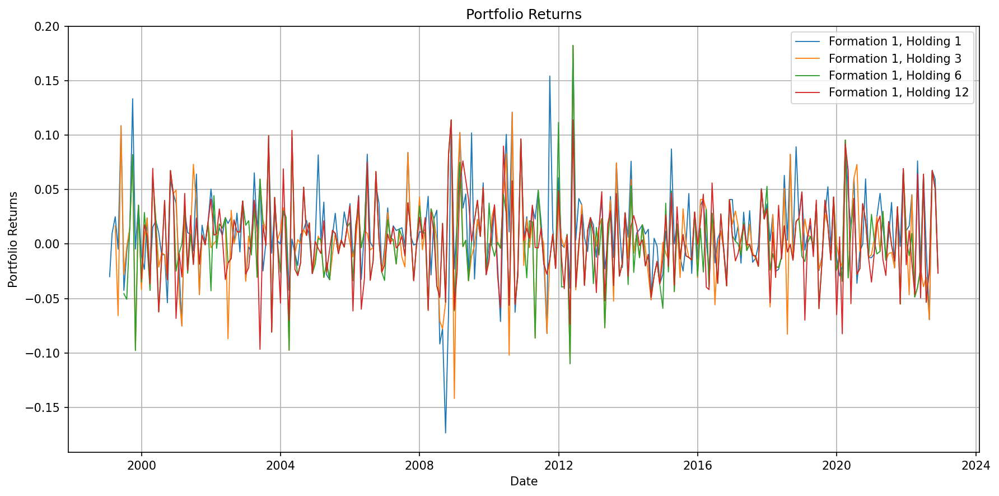

In [19]:
# Code
# Accessing and plotting portfolio returns
portfolio_1_1 = all_portfolio_returns['Formation_1_Holding_1']
portfolio_1_3 = all_portfolio_returns['Formation_1_Holding_3']
portfolio_1_6= all_portfolio_returns['Formation_1_Holding_6']
portfolio_1_12 = all_portfolio_returns['Formation_1_Holding_12']

portfolio_3_1 = all_portfolio_returns['Formation_3_Holding_1']
portfolio_3_3 = all_portfolio_returns['Formation_3_Holding_3']
portfolio_3_6 = all_portfolio_returns['Formation_3_Holding_6']
portfolio_3_12 = all_portfolio_returns['Formation_3_Holding_12']

portfolio_6_1 = all_portfolio_returns['Formation_6_Holding_1']
portfolio_6_3 = all_portfolio_returns['Formation_6_Holding_3']
portfolio_6_6 = all_portfolio_returns['Formation_6_Holding_6']
portfolio_6_12 = all_portfolio_returns['Formation_6_Holding_12']

portfolio_12_1 = all_portfolio_returns['Formation_12_Holding_1']
portfolio_12_3 = all_portfolio_returns['Formation_12_Holding_3']
portfolio_12_6 = all_portfolio_returns['Formation_12_Holding_6']
portfolio_12_12 = all_portfolio_returns['Formation_12_Holding_12']

# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)

# Plot Portfolio 1 returns
plt.plot(portfolio_1_1.index, portfolio_1_1['Portfolio_1'], label='Formation 1, Holding 1', linewidth = 0.9)
plt.plot(portfolio_1_3.index, portfolio_1_3['Portfolio_1'], label='Formation 1, Holding 3', linewidth = 0.9)
plt.plot(portfolio_1_6.index, portfolio_1_6['Portfolio_1'], label='Formation 1, Holding 6', linewidth = 0.9)
plt.plot(portfolio_1_12.index, portfolio_1_12['Portfolio_1'], label='Formation 1, Holding 12', linewidth = 0.9)


plt.title('Portfolio Returns')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


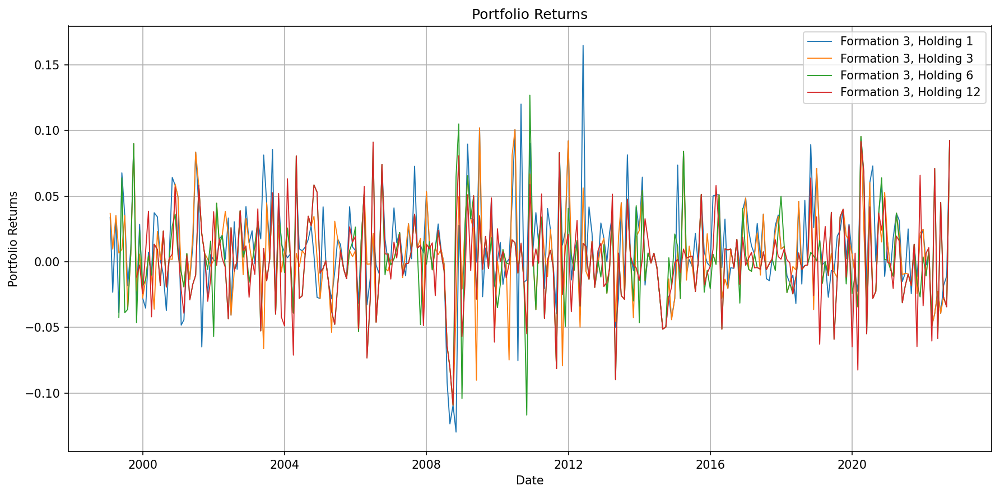

In [20]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)

plt.plot(portfolio_3_1.index, portfolio_3_1['Portfolio_1'], label='Formation 3, Holding 1', linewidth = 0.9)
plt.plot(portfolio_3_3.index, portfolio_3_3['Portfolio_1'], label='Formation 3, Holding 3', linewidth = 0.9)
plt.plot(portfolio_3_6.index, portfolio_3_6['Portfolio_1'], label='Formation 3, Holding 6', linewidth = 0.9)
plt.plot(portfolio_3_12.index, portfolio_3_12['Portfolio_1'], label='Formation 3, Holding 12', linewidth = 0.9)


plt.title('Portfolio Returns')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

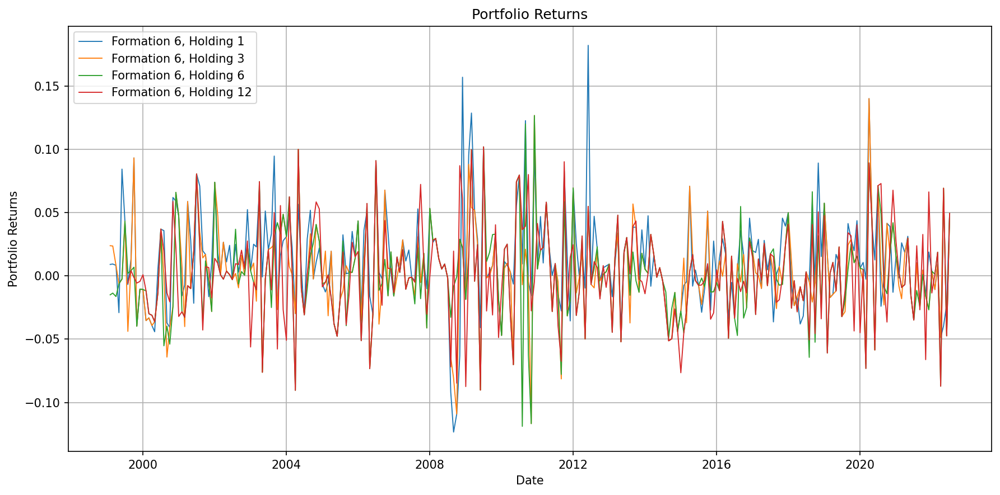

In [21]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)

plt.plot(portfolio_6_1.index, portfolio_6_1['Portfolio_1'], label='Formation 6, Holding 1', linewidth = 0.9)
plt.plot(portfolio_6_3.index, portfolio_6_3['Portfolio_1'], label='Formation 6, Holding 3', linewidth = 0.9)
plt.plot(portfolio_6_6.index, portfolio_6_6['Portfolio_1'], label='Formation 6, Holding 6', linewidth = 0.9)
plt.plot(portfolio_6_12.index, portfolio_6_12['Portfolio_1'], label='Formation 6, Holding 12', linewidth = 0.9)


plt.title('Portfolio Returns')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

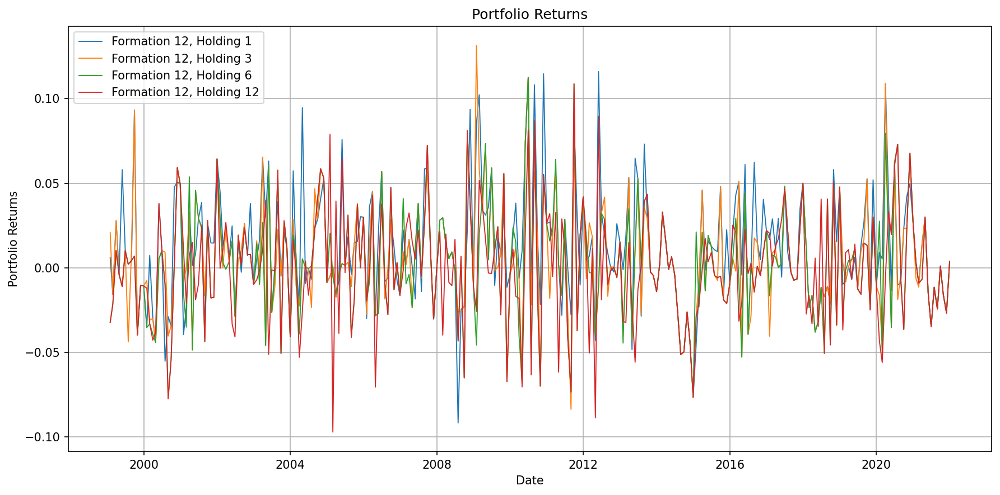

In [22]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)

plt.plot(portfolio_12_1.index, portfolio_12_1['Portfolio_1'], label='Formation 12, Holding 1', linewidth = 0.9)
plt.plot(portfolio_12_3.index, portfolio_12_3['Portfolio_1'], label='Formation 12, Holding 3', linewidth = 0.9)
plt.plot(portfolio_12_6.index, portfolio_12_6['Portfolio_1'], label='Formation 12, Holding 6', linewidth = 0.9)
plt.plot(portfolio_12_12.index, portfolio_12_12['Portfolio_1'], label='Formation 12, Holding 12', linewidth = 0.9)

plt.title('Portfolio Returns')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

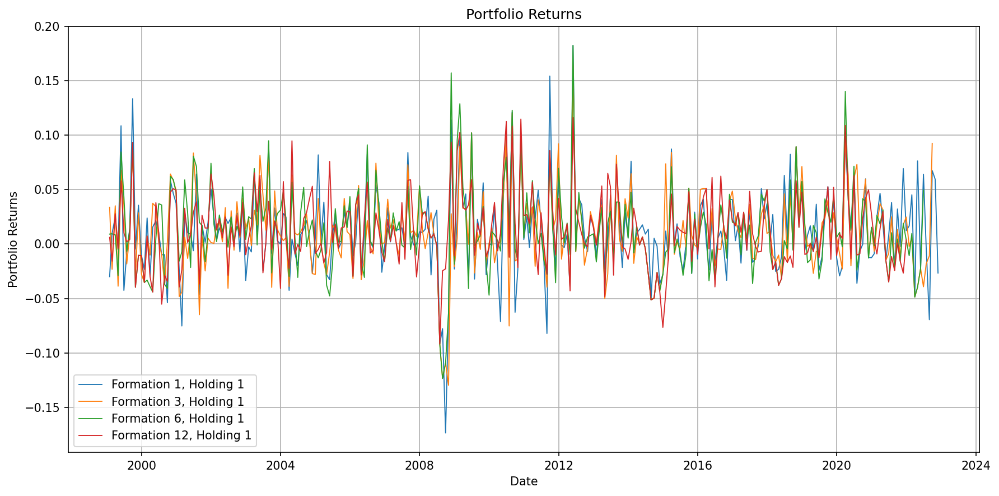

In [23]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)

plt.plot(portfolio_1_1.index, portfolio_1_1['Portfolio_1'], label='Formation 1, Holding 1', linewidth = 0.9)
plt.plot(portfolio_3_1.index, portfolio_3_1['Portfolio_1'], label='Formation 3, Holding 1', linewidth = 0.9)
plt.plot(portfolio_6_1.index, portfolio_6_1['Portfolio_1'], label='Formation 6, Holding 1', linewidth = 0.9)
plt.plot(portfolio_12_1.index, portfolio_12_1['Portfolio_1'], label='Formation 12, Holding 1', linewidth = 0.9)

plt.title('Portfolio Returns')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

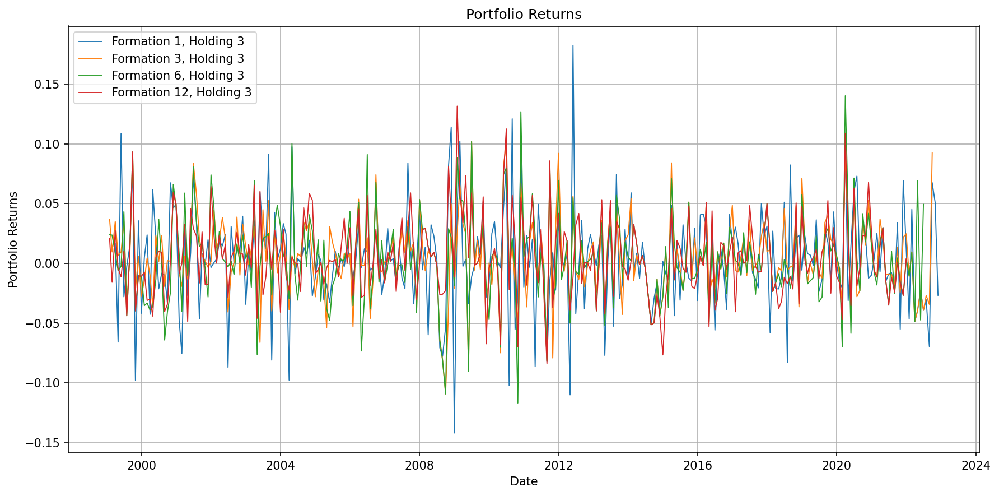

In [24]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)

plt.plot(portfolio_1_3.index, portfolio_1_3['Portfolio_1'], label='Formation 1, Holding 3', linewidth = 0.9)
plt.plot(portfolio_3_3.index, portfolio_3_3['Portfolio_1'], label='Formation 3, Holding 3', linewidth = 0.9)
plt.plot(portfolio_6_3.index, portfolio_6_3['Portfolio_1'], label='Formation 6, Holding 3', linewidth = 0.9)
plt.plot(portfolio_12_3.index, portfolio_12_3['Portfolio_1'], label='Formation 12, Holding 3', linewidth = 0.9)

plt.title('Portfolio Returns')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

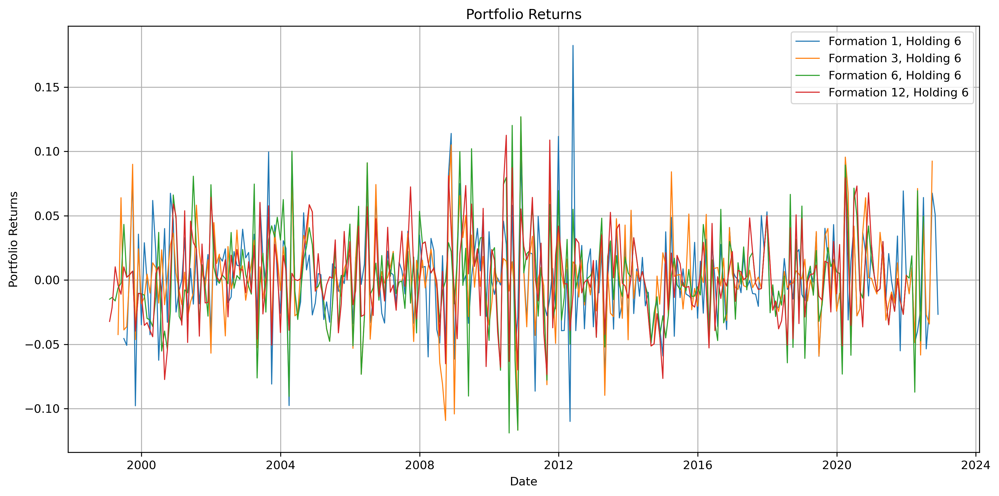

In [25]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=300)

plt.plot(portfolio_1_6.index, portfolio_1_6['Portfolio_1'], label='Formation 1, Holding 6', linewidth = 0.9)
plt.plot(portfolio_3_6.index, portfolio_3_6['Portfolio_1'], label='Formation 3, Holding 6', linewidth = 0.9)
plt.plot(portfolio_6_6.index, portfolio_6_6['Portfolio_1'], label='Formation 6, Holding 6', linewidth = 0.9)
plt.plot(portfolio_12_6.index, portfolio_12_6['Portfolio_1'], label='Formation 12, Holding 6', linewidth = 0.9)

plt.title('Portfolio Returns')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

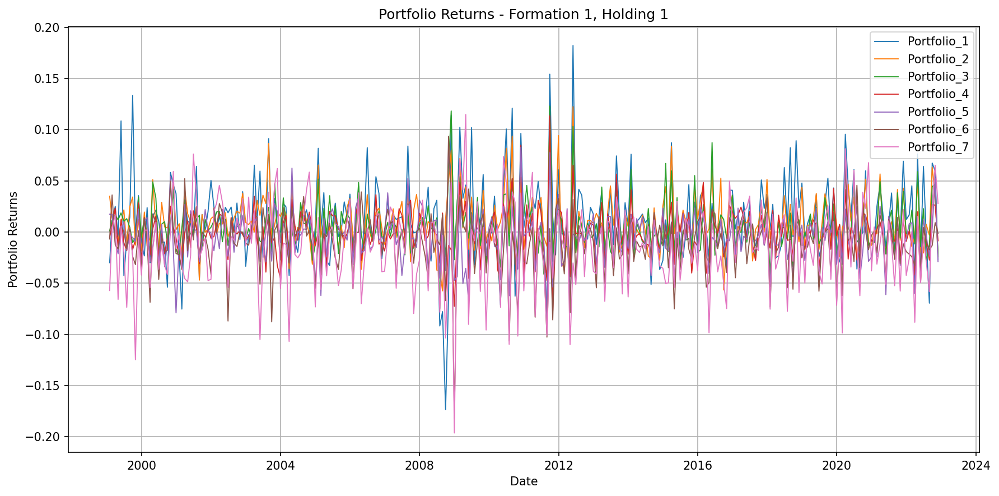

In [26]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)
# Loop through each portfolio and plot its returns
for i in range(1, 8):  # Assuming portfolios are named Portfolio_1 to Portfolio_7
    portfolio_name = f'Portfolio_{i}'
    plt.plot(portfolio_1_1.index, portfolio_1_1[portfolio_name], label=portfolio_name, linewidth = 0.9)

plt.title('Portfolio Returns - Formation 1, Holding 1')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

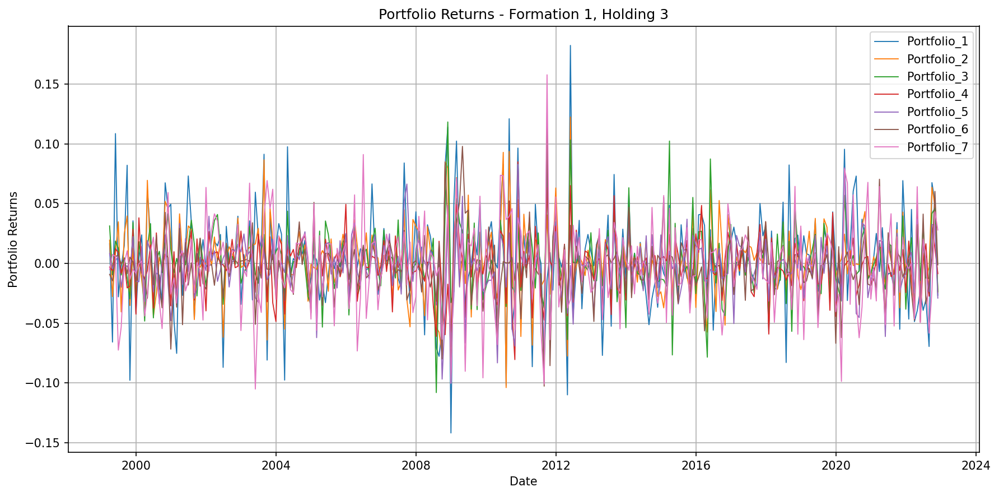

In [27]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)
# Loop through each portfolio and plot its returns
for i in range(1, 8):  # Assuming portfolios are named Portfolio_1 to Portfolio_7
    portfolio_name = f'Portfolio_{i}'
    plt.plot(portfolio_1_3.index, portfolio_1_3[portfolio_name], label=portfolio_name, linewidth = 0.9)

plt.title('Portfolio Returns - Formation 1, Holding 3')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

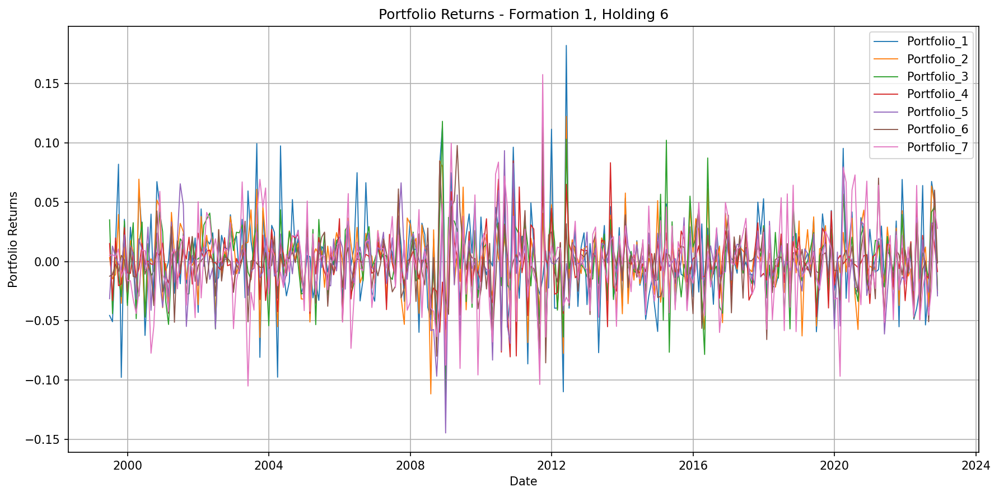

In [28]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)
# Loop through each portfolio and plot its returns
for i in range(1, 8):  # Assuming portfolios are named Portfolio_1 to Portfolio_7
    portfolio_name = f'Portfolio_{i}'
    plt.plot(portfolio_1_6.index, portfolio_1_6[portfolio_name], label=portfolio_name, linewidth = 0.9)

plt.title('Portfolio Returns - Formation 1, Holding 6')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

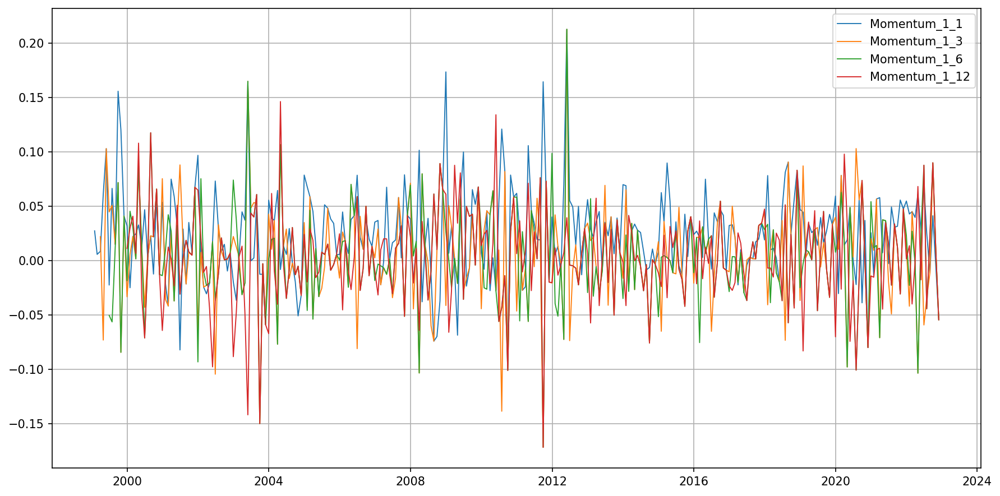

In [29]:
# Code
plt.figure(figsize=(12, 6), dpi=150)
# Get the angles from 0 to 2 pie (360 degree) in narray object 
X = portfolio_1_1.index
  
plt.plot(X, (portfolio_1_1['Portfolio_1']-portfolio_1_1['Portfolio_7']), label = 'Momentum_1_1', linewidth = 0.9)
plt.plot(X, (portfolio_1_3['Portfolio_1']-portfolio_1_3['Portfolio_7']), label = 'Momentum_1_3', linewidth = 0.9)
plt.plot(X, (portfolio_1_6['Portfolio_1']-portfolio_1_6['Portfolio_7']), label = 'Momentum_1_6', linewidth = 0.9)
plt.plot(X, (portfolio_1_12['Portfolio_1']-portfolio_1_12['Portfolio_7']), label = 'Momentum_1_12', linewidth = 0.9)
  
# Combine all the operations and display 
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show() 

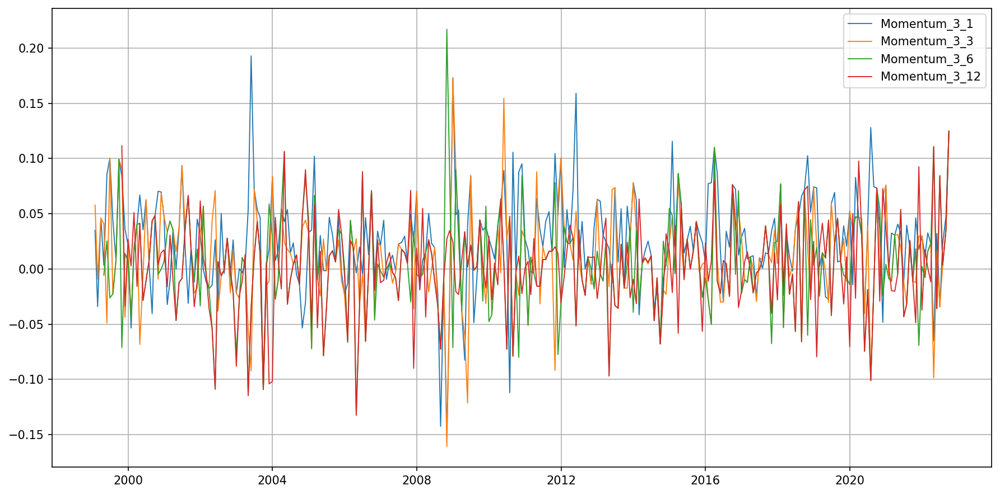

In [30]:
# Code
plt.figure(figsize=(12, 6), dpi=150)
# Get the angles from 0 to 2 pie (360 degree) in narray object 
X = portfolio_3_1.index
  
plt.plot(X, (portfolio_3_1['Portfolio_1']-portfolio_3_1['Portfolio_7']), label = 'Momentum_3_1', linewidth = 0.9)
plt.plot(X, (portfolio_3_3['Portfolio_1']-portfolio_3_3['Portfolio_7']), label = 'Momentum_3_3', linewidth = 0.9)
plt.plot(X, (portfolio_3_6['Portfolio_1']-portfolio_3_6['Portfolio_7']), label = 'Momentum_3_6', linewidth = 0.9)
plt.plot(X, (portfolio_3_12['Portfolio_1']-portfolio_3_12['Portfolio_7']), label = 'Momentum_3_12', linewidth = 0.9)
  
# Combine all the operations and display 
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show() 

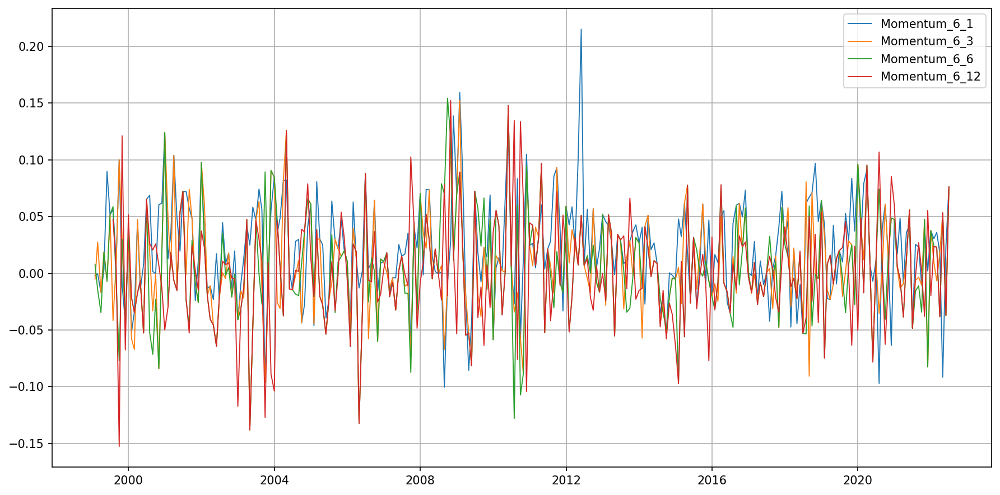

In [31]:
# Code
plt.figure(figsize=(12, 6), dpi=150)

X = portfolio_6_1.index
  
plt.plot(X, (portfolio_6_1['Portfolio_1']-portfolio_6_1['Portfolio_7']), label = 'Momentum_6_1', linewidth = 0.9)
plt.plot(X, (portfolio_6_3['Portfolio_1']-portfolio_6_3['Portfolio_7']), label = 'Momentum_6_3', linewidth = 0.9)
plt.plot(X, (portfolio_6_6['Portfolio_1']-portfolio_6_6['Portfolio_7']), label = 'Momentum_6_6', linewidth = 0.9)
plt.plot(X, (portfolio_6_12['Portfolio_1']-portfolio_6_12['Portfolio_7']), label = 'Momentum_6_12', linewidth = 0.9)
  
# Combine all the operations and display 
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show() 

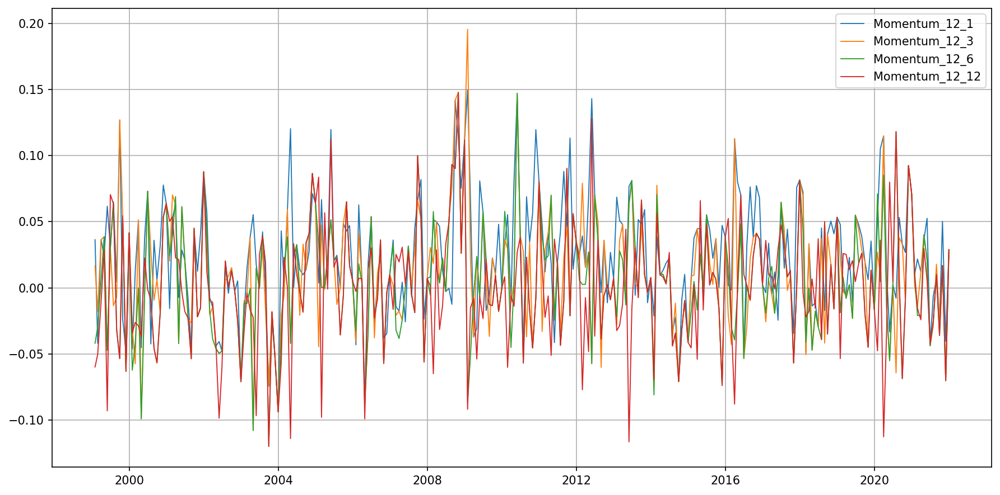

In [32]:
plt.figure(figsize=(12, 6), dpi=150)
# Get the angles from 0 to 2 pie (360 degree) in narray object 
X = portfolio_12_1.index
  
plt.plot(X, (portfolio_12_1['Portfolio_1']-portfolio_12_1['Portfolio_7']), label = 'Momentum_12_1', linewidth = 0.9)
plt.plot(X, (portfolio_12_3['Portfolio_1']-portfolio_12_3['Portfolio_7']), label = 'Momentum_12_3', linewidth = 0.9)
plt.plot(X, (portfolio_12_6['Portfolio_1']-portfolio_12_6['Portfolio_7']), label = 'Momentum_12_6', linewidth = 0.9)
plt.plot(X, (portfolio_12_12['Portfolio_1']-portfolio_12_12['Portfolio_7']), label = 'Momentum_12_12', linewidth = 0.9)
  
# Combine all the operations and display 
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Table Creation

In [33]:
# Create a table to summarize the returns and statistics
summary_table = pd.DataFrame(index=['P1 (Past Winners)', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7 (Past Losers)', 'Momentum (P1-P7)'])

for key, df in all_portfolio_returns.items():
    # Calculate returns for P1 to P7
    for i in range(1, portfolios + 1):
        if f'Portfolio_{i}' in df.columns:
            if i == 1:
                summary_table.loc['P1 (Past Winners)', key] = df[f'Portfolio_{i}'].mean()
            elif i == 7:
                summary_table.loc['P7 (Past Losers)', key] = df[f'Portfolio_{i}'].mean()
            else:
                summary_table.loc[f'P{i}', key] = df[f'Portfolio_{i}'].mean()

    # Calculate P1-P7 and t-statistic
    if 'Portfolio_1' in df.columns and 'Portfolio_7' in df.columns:
        summary_table.loc['Momentum (P1-P7)', key] = df['Portfolio_1'].mean() - df['Portfolio_7'].mean()
        portfolio_1 = df['Portfolio_1'].dropna()
        portfolio_7 = df['Portfolio_7'].dropna()
       

# Display the summary table
print("\nSummary Table - Raw Excess Returns:")
print(summary_table)
print("\nSummary Table - Raw Excess Returns:")
print(tabulate(summary_table))


Summary Table - Raw Excess Returns:
                   Formation_1_Holding_1  Formation_1_Holding_3  \
P1 (Past Winners)               0.012478               0.003617   
P2                              0.009976               0.002932   
P3                              0.005327               0.001881   
P4                             -0.001125              -0.001561   
P5                             -0.004477              -0.001898   
P6                             -0.009464              -0.003317   
P7 (Past Losers)               -0.012756              -0.001886   
Momentum (P1-P7)                0.025234               0.005503   

                   Formation_1_Holding_6  Formation_1_Holding_12  \
P1 (Past Winners)               0.002242                0.002629   
P2                              0.002150                0.000795   
P3                              0.001220               -0.000708   
P4                             -0.000959               -0.000718   
P5                 

## Momentum Graphs

### Boxplots

/var/folders/s4/3hsvd919761gmfw738y1nq5c0000gn/T/ipykernel_66308/3274166842.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 0].set_xticklabels(['Formation_1_Holding_1','Formation_1_Holding_3','Formation_1_Holding_6' ,'Formation_1_Holding_12'])
/var/folders/s4/3hsvd919761gmfw738y1nq5c0000gn/T/ipykernel_66308/3274166842.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(['Formation_3_Holding_1','Formation_3_Holding_3','Formation_3_Holding_6' ,'Formation_3_Holding_12'])
/var/folders/s4/3hsvd919761gmfw738y1nq5c0000gn/T/ipykernel_66308/3274166842.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(['Formation_6_Holding_1','Formation_6_Holding_3','Formation_6_Holding_6' ,'For

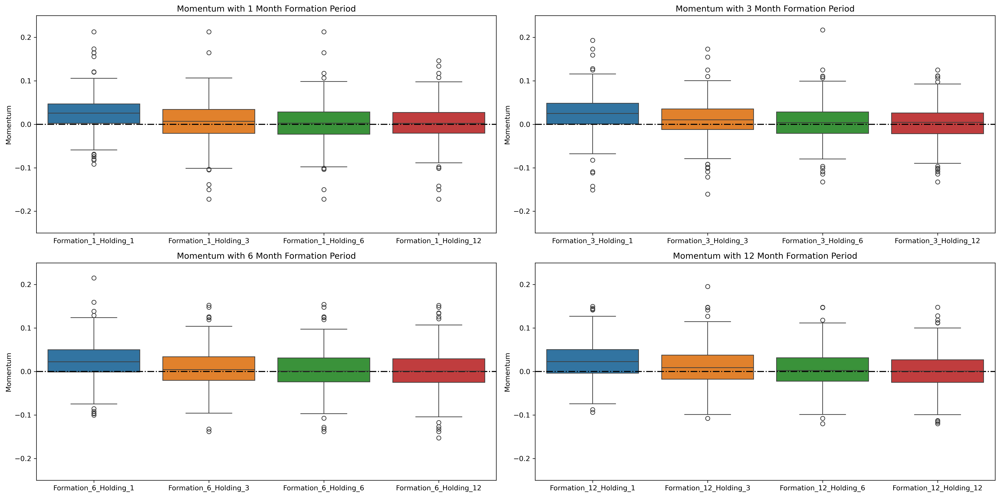

In [34]:
# Code
# Defineíng columns to plot
columns_to_plot_1 = ['Momentum_Formation_1_Holding_1','Momentum_Formation_1_Holding_3','Momentum_Formation_1_Holding_6' ,'Momentum_Formation_1_Holding_12']

columns_to_plot_6 = ['Momentum_Formation_3_Holding_1','Momentum_Formation_3_Holding_3','Momentum_Formation_3_Holding_6' ,'Momentum_Formation_3_Holding_12']

columns_to_plot_3 = ['Momentum_Formation_6_Holding_1','Momentum_Formation_6_Holding_3','Momentum_Formation_6_Holding_6' ,'Momentum_Formation_6_Holding_12']

columns_to_plot_12 = ['Momentum_Formation_12_Holding_1','Momentum_Formation_12_Holding_3','Momentum_Formation_12_Holding_6' ,'Momentum_Formation_12_Holding_12']

# Creating a box plot for the specified columns
fig, axes = plt.subplots(2,2,figsize=(20, 10), dpi=300 )

# Plotting and setting x-axis labels for each subplot
sns.boxplot(data=momentum[columns_to_plot_1], ax=axes[0, 0])
axes[0, 0].set_title('Momentum with 1 Month Formation Period')
axes[0, 0].set_ylabel('Momentum')
#axes[0, 0].set_xlabel('Portfolios')
axes[0, 0].set_xticklabels(['Formation_1_Holding_1','Formation_1_Holding_3','Formation_1_Holding_6' ,'Formation_1_Holding_12'])
#axes[0, 0].legend(labels=['Formation_1_Holding_1','Formation_1_Holding_3','Formation_1_Holding_6' ,'Formation_1_Holding_12'], loc='lower right')
axes[0, 0].axhline(y=0, color='k', linestyle='dashdot')
axes[0, 0].set_ylim(-0.25,0.25)

sns.boxplot(data=momentum[columns_to_plot_6], ax=axes[0, 1])
axes[0, 1].set_title('Momentum with 3 Month Formation Period')
axes[0, 1].set_ylabel('Momentum')
#axes[0, 1].set_xlabel('Portfolios')
axes[0, 1].set_xticklabels(['Formation_3_Holding_1','Formation_3_Holding_3','Formation_3_Holding_6' ,'Formation_3_Holding_12'])
#axes[0, 1].legend(labels=['Formation_3_Holding_1','Formation_3_Holding_3','Formation_3_Holding_6' ,'Formation_3_Holding_12'], loc='lower right')
axes[0, 1].axhline(y=0, color='k', linestyle='dashdot')
axes[0, 1].set_ylim(-0.25,0.25)

sns.boxplot(data=momentum[columns_to_plot_3], ax=axes[1, 0])
axes[1, 0].set_title('Momentum with 6 Month Formation Period')
axes[1, 0].set_ylabel('Momentum')
#axes[1, 0].set_xlabel('Portfolios')
axes[1, 0].set_xticklabels(['Formation_6_Holding_1','Formation_6_Holding_3','Formation_6_Holding_6' ,'Formation_6_Holding_12'])
#axes[1, 0].legend(labels=['Formation_6_Holding_1','Formation_6_Holding_3','Formation_6_Holding_6' ,'Formation_6_Holding_12'], loc='lower right')
axes[1, 0].axhline(y=0, color='k', linestyle='dashdot')
axes[1, 0].set_ylim(-0.25,0.25)

sns.boxplot(data=momentum[columns_to_plot_12], ax=axes[1, 1])
axes[1, 1].set_title('Momentum with 12 Month Formation Period')
axes[1, 1].set_ylabel('Momentum')
#axes[1, 1].set_xlabel('Portfolios')
axes[1, 1].set_xticklabels(['Formation_12_Holding_1','Formation_12_Holding_3','Formation_12_Holding_6' ,'Formation_12_Holding_12'])
#axes[1, 1].legend(labels=['Formation_12_Holding_1','Formation_12_Holding_3','Formation_12_Holding_6' ,'Formation_12_Holding_12'], loc='lower right')
axes[1, 1].axhline(y=0, color='k', linestyle='dashdot')
axes[1, 1].set_ylim(-0.25,0.25)

# Adjusting layout
plt.tight_layout()

plt.show()

### Bar Charts

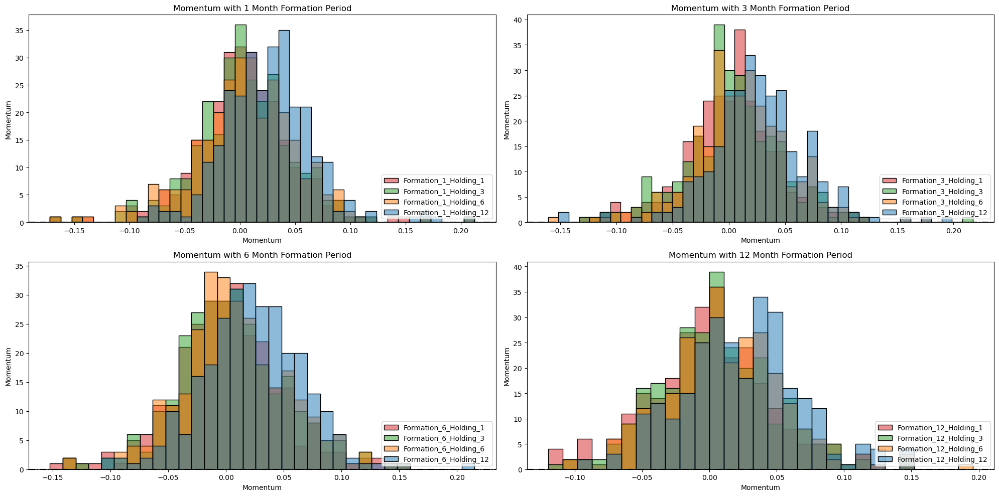

In [35]:
# Code
# Defining columns to plot
columns_to_plot_1 = ['Momentum_Formation_1_Holding_1','Momentum_Formation_1_Holding_3','Momentum_Formation_1_Holding_6' ,'Momentum_Formation_1_Holding_12']

columns_to_plot_6 = ['Momentum_Formation_3_Holding_1','Momentum_Formation_3_Holding_3','Momentum_Formation_3_Holding_6' ,'Momentum_Formation_3_Holding_12']

columns_to_plot_3 = ['Momentum_Formation_6_Holding_1','Momentum_Formation_6_Holding_3','Momentum_Formation_6_Holding_6' ,'Momentum_Formation_6_Holding_12']

columns_to_plot_12 = ['Momentum_Formation_12_Holding_1','Momentum_Formation_12_Holding_3','Momentum_Formation_12_Holding_6' ,'Momentum_Formation_12_Holding_12']

# Creating a box plot for the specified columns
fig, axes = plt.subplots(2,2,figsize=(20, 10) )

# Plotting and setting x-axis labels for each subplot
sns.histplot(data=momentum[columns_to_plot_1], ax=axes[0, 0])
axes[0, 0].set_title('Momentum with 1 Month Formation Period')
axes[0, 0].set_ylabel('Momentum')
#axes[0, 0].set_xlabel('Portfolios')
#axes[0, 0].set_xticklabels(['Formation_1_Holding_1','Formation_1_Holding_3','Formation_1_Holding_6' ,'Formation_1_Holding_12'])
axes[0, 0].legend(labels=['Formation_1_Holding_1','Formation_1_Holding_3','Formation_1_Holding_6' ,'Formation_1_Holding_12'], loc='lower right')
axes[0, 0].axhline(y=0, color='k', linestyle='dashdot')
axes[0, 0].set_xlabel('Momentum')

sns.histplot(data=momentum[columns_to_plot_6], ax=axes[0, 1])
axes[0, 1].set_title('Momentum with 3 Month Formation Period')
axes[0, 1].set_ylabel('Momentum')
#axes[0, 1].set_xlabel('Portfolios')
#axes[0, 1].set_xticklabels(['Formation_3_Holding_1','Formation_3_Holding_3','Formation_3_Holding_6' ,'Formation_3_Holding_12'])
axes[0, 1].legend(labels=['Formation_3_Holding_1','Formation_3_Holding_3','Formation_3_Holding_6' ,'Formation_3_Holding_12'], loc='lower right')
axes[0, 1].axhline(y=0, color='k', linestyle='dashdot')
axes[0, 1].set_xlabel('Momentum')

sns.histplot(data=momentum[columns_to_plot_3], ax=axes[1, 0])
axes[1, 0].set_title('Momentum with 6 Month Formation Period')
axes[1, 0].set_ylabel('Momentum')
#axes[1, 0].set_xlabel('Portfolios')
#axes[1, 0].set_xticklabels(['Formation_6_Holding_1','Formation_6_Holding_3','Formation_6_Holding_6' ,'Formation_6_Holding_12'])
axes[1, 0].legend(labels=['Formation_6_Holding_1','Formation_6_Holding_3','Formation_6_Holding_6' ,'Formation_6_Holding_12'], loc='lower right')
axes[1, 0].axhline(y=0, color='k', linestyle='dashdot')
axes[1, 0].set_xlabel('Momentum')

sns.histplot(data=momentum[columns_to_plot_12], ax=axes[1, 1])
axes[1, 1].set_title('Momentum with 12 Month Formation Period')
axes[1, 1].set_ylabel('Momentum')
#axes[1, 1].set_xlabel('Portfolios')
#axes[1, 1].set_xticklabels(['Formation_12_Holding_1','Formation_12_Holding_3','Formation_12_Holding_6' ,'Formation_12_Holding_12'])
axes[1, 1].legend(labels=['Formation_12_Holding_1','Formation_12_Holding_3','Formation_12_Holding_6' ,'Formation_12_Holding_12'], loc='lower right')
axes[1, 1].axhline(y=0, color='k', linestyle='dashdot')
axes[1, 1].set_xlabel('Momentum')

# Adjusting layout
plt.tight_layout()
plt.show()

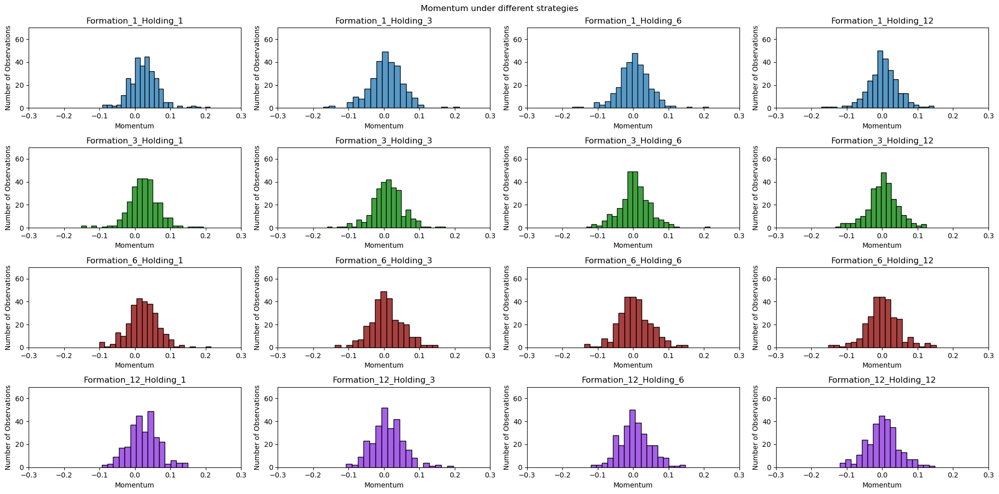

In [36]:
# Code

# Creating a box plot for the specified columns
fig, axes = plt.subplots(4,4,figsize=(20, 10) )
fig.suptitle('Momentum under different strategies')

# Plotting Subplots
## 1 Month Formation
sns.histplot(data=momentum['Momentum_Formation_1_Holding_1'], ax=axes[0, 0], )
axes[0, 0].set_title('Formation_1_Holding_1')
axes[0, 0].set_ylabel('Number of Observations')
axes[0, 0].set_xlabel('Momentum')
axes[0, 0].set_ylim(0, 70)
axes[0, 0].set_xlim(-0.3, 0.3)

sns.histplot(data=momentum['Momentum_Formation_1_Holding_3'], ax=axes[0, 1])
axes[0, 1].set_title('Formation_1_Holding_3')
axes[0, 1].set_ylabel('Number of Observations')
axes[0, 1].set_xlabel('Momentum')
axes[0, 1].set_ylim(0, 70)
axes[0, 1].set_xlim(-0.3, 0.3)

sns.histplot(data=momentum['Momentum_Formation_1_Holding_6'], ax=axes[0, 2])
axes[0, 2].set_title('Formation_1_Holding_6')
axes[0, 2].set_ylabel('Number of Observations')
axes[0, 2].set_xlabel('Momentum')
axes[0, 2].set_ylim(0, 70)
axes[0, 2].set_xlim(-0.3, 0.3)

sns.histplot(data=momentum['Momentum_Formation_1_Holding_12'], ax=axes[0, 3])
axes[0, 3].set_title('Formation_1_Holding_12')
axes[0, 3].set_ylabel('Number of Observations')
axes[0, 3].set_xlabel('Momentum')
axes[0, 3].set_ylim(0, 70)
axes[0, 3].set_xlim(-0.3, 0.3)

## 3 Month Formation
sns.histplot(data=momentum['Momentum_Formation_3_Holding_1'], ax=axes[1, 0], color='g')
axes[1, 0].set_title('Formation_3_Holding_1')
axes[1, 0].set_ylabel('Number of Observations')
axes[1, 0].set_xlabel('Momentum')
axes[1, 0].set_ylim(0, 70)
axes[1, 0].set_xlim(-0.3, 0.3)

sns.histplot(data=momentum['Momentum_Formation_3_Holding_3'], ax=axes[1, 1], color='g')
axes[1, 1].set_title('Formation_3_Holding_3')
axes[1, 1].set_ylabel('Number of Observations')
axes[1, 1].set_xlabel('Momentum')
axes[1, 1].set_ylim(0, 70)
axes[1, 1].set_xlim(-0.3, 0.3)

sns.histplot(data=momentum['Momentum_Formation_3_Holding_6'], ax=axes[1, 2], color='g')
axes[1, 2].set_title('Formation_3_Holding_6')
axes[1, 2].set_ylabel('Number of Observations')
axes[1, 2].set_xlabel('Momentum')
axes[1, 2].set_ylim(0, 70)
axes[1, 2].set_xlim(-0.3, 0.3)

sns.histplot(data=momentum['Momentum_Formation_3_Holding_12'], ax=axes[1, 3], color='g')
axes[1, 3].set_title('Formation_3_Holding_12')
axes[1, 3].set_ylabel('Number of Observations')
axes[1, 3].set_xlabel('Momentum')
axes[1, 3].set_ylim(0, 70)
axes[1, 3].set_xlim(-0.3, 0.3)

## 6 Month Formation
sns.histplot(data=momentum['Momentum_Formation_6_Holding_1'], ax=axes[2, 0], color='darkred')
axes[2, 0].set_title('Formation_6_Holding_1')
axes[2, 0].set_ylabel('Number of Observations')
axes[2, 0].set_xlabel('Momentum')
axes[2, 0].set_ylim(0, 70)
axes[2, 0].set_xlim(-0.3, 0.3)

sns.histplot(data=momentum['Momentum_Formation_6_Holding_3'], ax=axes[2, 1], color='darkred')
axes[2, 1].set_title('Formation_6_Holding_3')
axes[2, 1].set_ylabel('Number of Observations')
axes[2, 1].set_xlabel('Momentum')
axes[2, 1].set_ylim(0, 70)
axes[2, 1].set_xlim(-0.3, 0.3)

sns.histplot(data=momentum['Momentum_Formation_6_Holding_6'], ax=axes[2, 2], color='darkred')
axes[2, 2].set_title('Formation_6_Holding_6')
axes[2, 2].set_ylabel('Number of Observations')
axes[2, 2].set_xlabel('Momentum')
axes[2, 2].set_ylim(0, 70)
axes[2, 2].set_xlim(-0.3, 0.3)

sns.histplot(data=momentum['Momentum_Formation_6_Holding_12'], ax=axes[2, 3], color='darkred')
axes[2, 3].set_title('Formation_6_Holding_12')
axes[2, 3].set_ylabel('Number of Observations')
axes[2, 3].set_xlabel('Momentum')
axes[2, 3].set_ylim(0, 70)
axes[2, 3].set_xlim(-0.3, 0.3)

## 12 Month Formation
sns.histplot(data=momentum['Momentum_Formation_12_Holding_1'], ax=axes[3, 0], color='blueviolet')
axes[3, 0].set_title('Formation_12_Holding_1')
axes[3, 0].set_ylabel('Number of Observations')
axes[3, 0].set_xlabel('Momentum')
axes[3, 0].set_ylim(0, 70)
axes[3, 0].set_xlim(-0.3, 0.3)


sns.histplot(data=momentum['Momentum_Formation_12_Holding_3'], ax=axes[3,1], color='blueviolet')
axes[3, 1].set_title('Formation_12_Holding_3')
axes[3, 1].set_ylabel('Number of Observations')
axes[3, 1].set_xlabel('Momentum')
axes[3, 1].set_ylim(0, 70)
axes[3, 1].set_xlim(-0.3, 0.3)


sns.histplot(data=momentum['Momentum_Formation_12_Holding_6'], ax=axes[3, 2], color='blueviolet')
axes[3, 2].set_title('Formation_12_Holding_6')
axes[3, 2].set_ylabel('Number of Observations')
axes[3, 2].set_xlabel('Momentum')
axes[3, 2].set_ylim(0, 70)
axes[3, 2].set_xlim(-0.3, 0.3)


sns.histplot(data=momentum['Momentum_Formation_12_Holding_12'], ax=axes[3, 3], color='blueviolet')
axes[3, 3].set_title('Formation_12_Holding_12')
axes[3, 3].set_ylabel('Number of Observations')
axes[3, 3].set_xlabel('Momentum')
axes[3, 3].set_ylim(0, 70)
axes[3, 3].set_xlim(-0.3, 0.3)




# Adjusting layout
plt.tight_layout()
plt.show()

#### Momentum Summary Statistics

In [37]:
momentum.skew()

Momentum_Formation_1_Holding_1      0.584815
Momentum_Formation_1_Holding_3     -0.093857
Momentum_Formation_1_Holding_6      0.092964
Momentum_Formation_1_Holding_12    -0.248089
Momentum_Formation_3_Holding_1     -0.136783
Momentum_Formation_3_Holding_3     -0.061906
Momentum_Formation_3_Holding_6      0.247421
Momentum_Formation_3_Holding_12    -0.162403
Momentum_Formation_6_Holding_1      0.166137
Momentum_Formation_6_Holding_3      0.182138
Momentum_Formation_6_Holding_6      0.154588
Momentum_Formation_6_Holding_12      0.09838
Momentum_Formation_12_Holding_1     0.191122
Momentum_Formation_12_Holding_3     0.415134
Momentum_Formation_12_Holding_6     0.226131
Momentum_Formation_12_Holding_12    0.080867
dtype: object

In [38]:
momentum.std()

Momentum_Formation_1_Holding_1      0.041068
Momentum_Formation_1_Holding_3      0.047393
Momentum_Formation_1_Holding_6      0.045294
Momentum_Formation_1_Holding_12     0.043322
Momentum_Formation_3_Holding_1      0.043712
Momentum_Formation_3_Holding_3      0.043652
Momentum_Formation_3_Holding_6       0.04417
Momentum_Formation_3_Holding_12     0.042317
Momentum_Formation_6_Holding_1      0.043562
Momentum_Formation_6_Holding_3      0.045586
Momentum_Formation_6_Holding_6      0.046568
Momentum_Formation_6_Holding_12      0.04762
Momentum_Formation_12_Holding_1     0.043144
Momentum_Formation_12_Holding_3     0.044565
Momentum_Formation_12_Holding_6      0.04365
Momentum_Formation_12_Holding_12    0.045622
dtype: object

In [39]:
momentum.mean()

Momentum_Formation_1_Holding_1      0.025234
Momentum_Formation_1_Holding_3      0.005503
Momentum_Formation_1_Holding_6       0.00382
Momentum_Formation_1_Holding_12     0.002789
Momentum_Formation_3_Holding_1      0.025794
Momentum_Formation_3_Holding_3      0.010654
Momentum_Formation_3_Holding_6      0.003765
Momentum_Formation_3_Holding_12     0.001571
Momentum_Formation_6_Holding_1      0.023426
Momentum_Formation_6_Holding_3      0.007741
Momentum_Formation_6_Holding_6      0.004114
Momentum_Formation_6_Holding_12     0.001519
Momentum_Formation_12_Holding_1     0.024271
Momentum_Formation_12_Holding_3     0.010484
Momentum_Formation_12_Holding_6     0.004561
Momentum_Formation_12_Holding_12    0.000383
dtype: object

### Line Charts

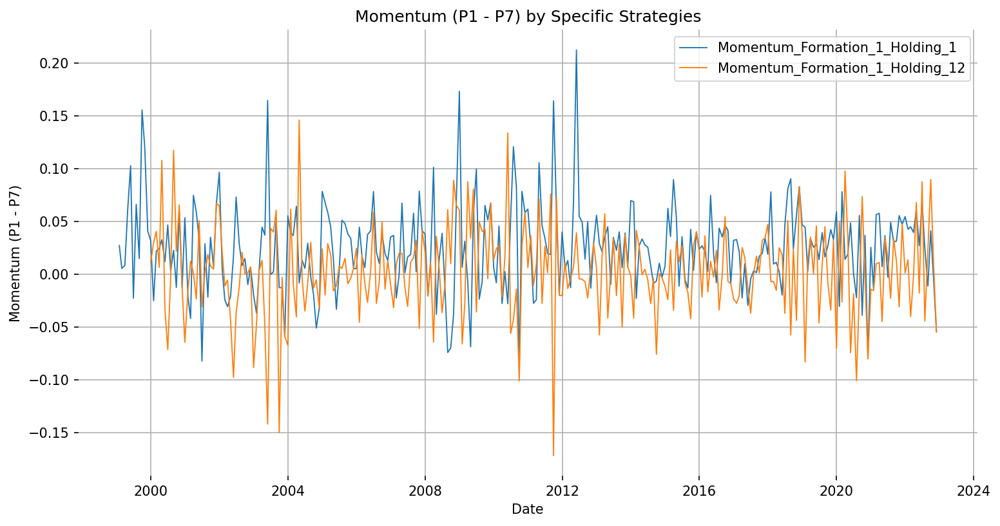

In [40]:
# Code
columns_to_plot = ['Momentum_Formation_1_Holding_1','Momentum_Formation_1_Holding_12']

# Plotting specific columns from the momentum dataframe
plt.figure(figsize=(12, 6), dpi=150)
for column in columns_to_plot:
    plt.plot(momentum.index, momentum[column], label=column,linewidth=0.9)

plt.title('Momentum (P1 - P7) by Specific Strategies')
plt.xlabel('Date')
plt.ylabel('Momentum (P1 - P7)')
plt.legend(loc='upper right')
plt.grid(True)
plt.box(False)
plt.show()

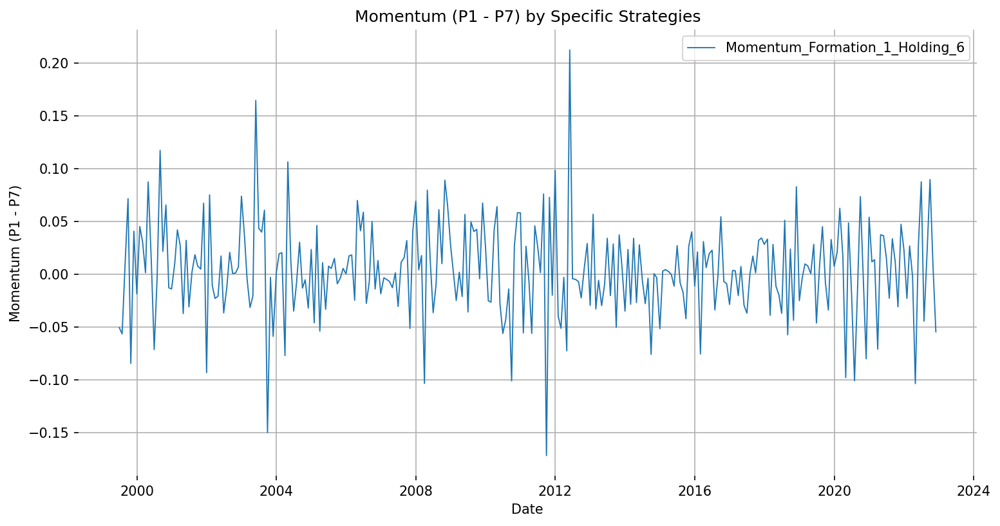

In [41]:
# Code
columns_to_plot = ['Momentum_Formation_1_Holding_6']

# Plotting specific columns from the momentum dataframe
plt.figure(figsize=(12, 6), dpi=150)
for column in columns_to_plot:
    plt.plot(momentum.index, momentum[column], label=column,linewidth=0.9)

plt.title('Momentum (P1 - P7) by Specific Strategies')
plt.xlabel('Date')
plt.ylabel('Momentum (P1 - P7)')
plt.legend(loc='upper right')
plt.grid(True)
plt.box(False)
plt.show()

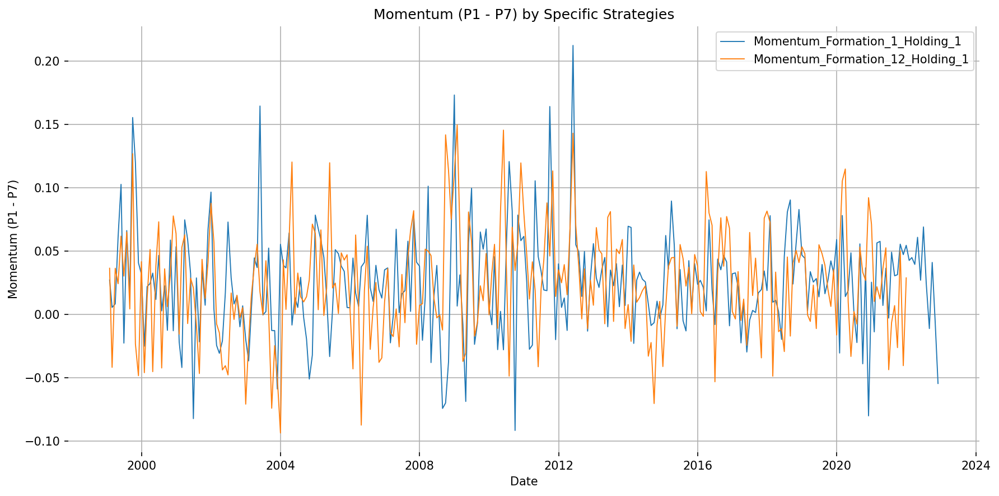

In [42]:
# Code
columns_to_plot = ['Momentum_Formation_1_Holding_1','Momentum_Formation_12_Holding_1']

# Plotting specific columns from the momentum dataframe
plt.figure(figsize=(12, 6), dpi=150)
for column in columns_to_plot:
    plt.plot(momentum.index, momentum[column], label=column,linewidth=0.9)

plt.title('Momentum (P1 - P7) by Specific Strategies')
plt.xlabel('Date')
plt.ylabel('Momentum (P1 - P7)')
plt.legend(loc='upper right')
plt.grid(True)
plt.box(False)
plt.tight_layout()
plt.show()

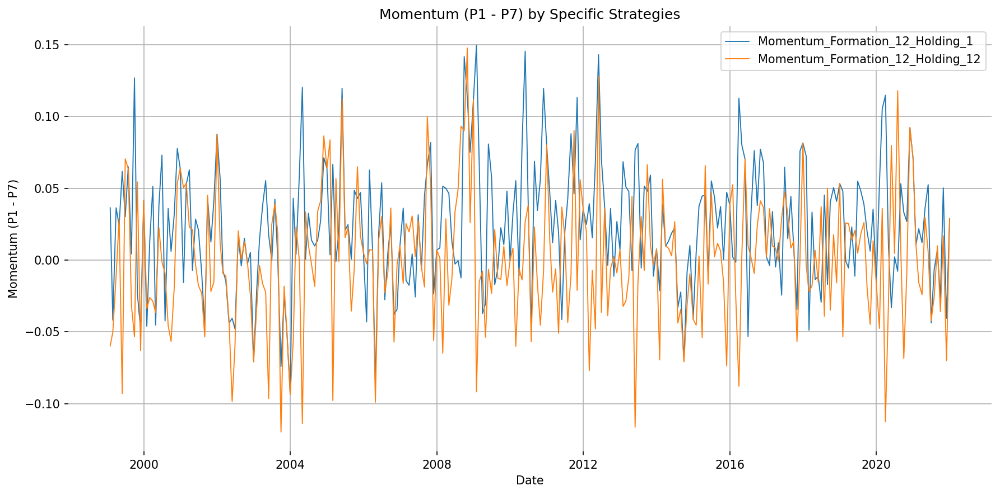

In [43]:
# Code
columns_to_plot = ['Momentum_Formation_12_Holding_1','Momentum_Formation_12_Holding_12'] 

# Plotting specific columns from the momentum dataframe
plt.figure(figsize=(12, 6), dpi=150)
for column in columns_to_plot:
    plt.plot(momentum.index, momentum[column], label=column,linewidth=0.9)

plt.title('Momentum (P1 - P7) by Specific Strategies')
plt.xlabel('Date')
plt.ylabel('Momentum (P1 - P7)')
plt.legend(loc='upper right')
plt.grid(True)
plt.box(False)
plt.tight_layout()
plt.show()

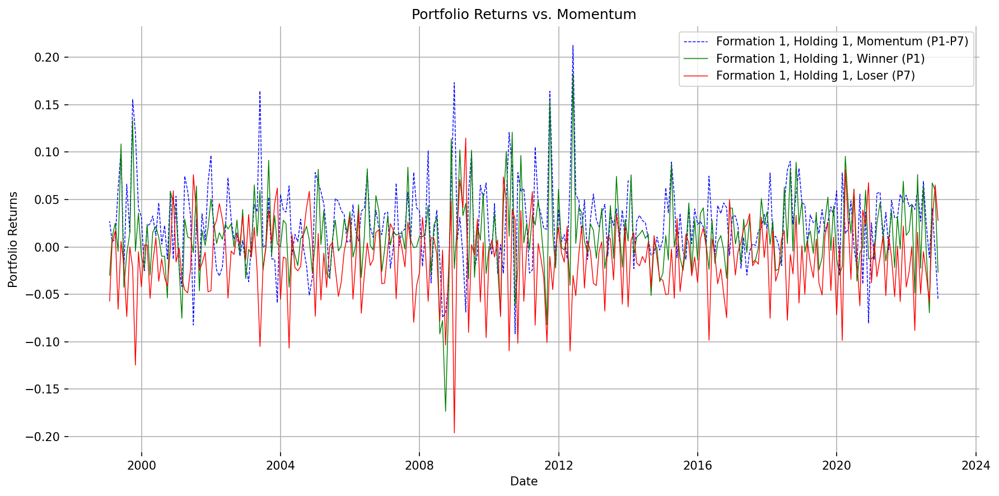

In [44]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)

plt.plot(momentum.index, momentum['Momentum_Formation_1_Holding_1'], label='Formation 1, Holding 1, Momentum (P1-P7)', color='blue', linestyle='dashed', linewidth=0.7)
plt.plot(portfolio_1_1.index, portfolio_1_1['Portfolio_1'], label='Formation 1, Holding 1, Winner (P1)', color='green', linewidth=0.7)
plt.plot(portfolio_1_1.index, portfolio_1_1['Portfolio_7'], label='Formation 1, Holding 1, Loser (P7)', color='red', linewidth=0.7)

plt.title('Portfolio Returns vs. Momentum')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.box(False)
plt.tight_layout()
plt.show()

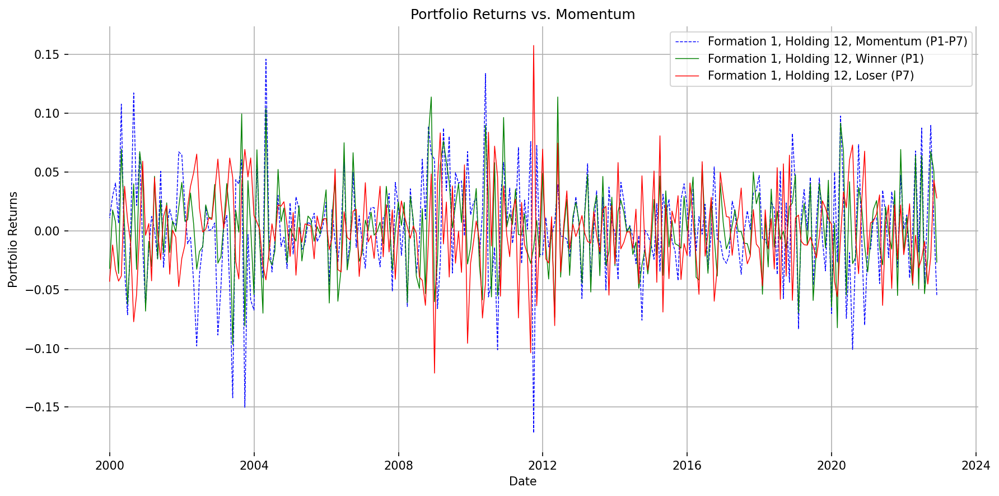

In [45]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)

plt.plot(momentum.index, momentum['Momentum_Formation_1_Holding_12'], label='Formation 1, Holding 12, Momentum (P1-P7)', color='blue', linestyle='dashed', linewidth=0.7)
plt.plot(portfolio_1_12.index, portfolio_1_12['Portfolio_1'], label='Formation 1, Holding 12, Winner (P1)', color='green', linewidth=0.7)
plt.plot(portfolio_1_12.index, portfolio_1_12['Portfolio_7'], label='Formation 1, Holding 12, Loser (P7)', color='red', linewidth=0.7)

plt.title('Portfolio Returns vs. Momentum')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.box(False)
plt.tight_layout()
plt.show()

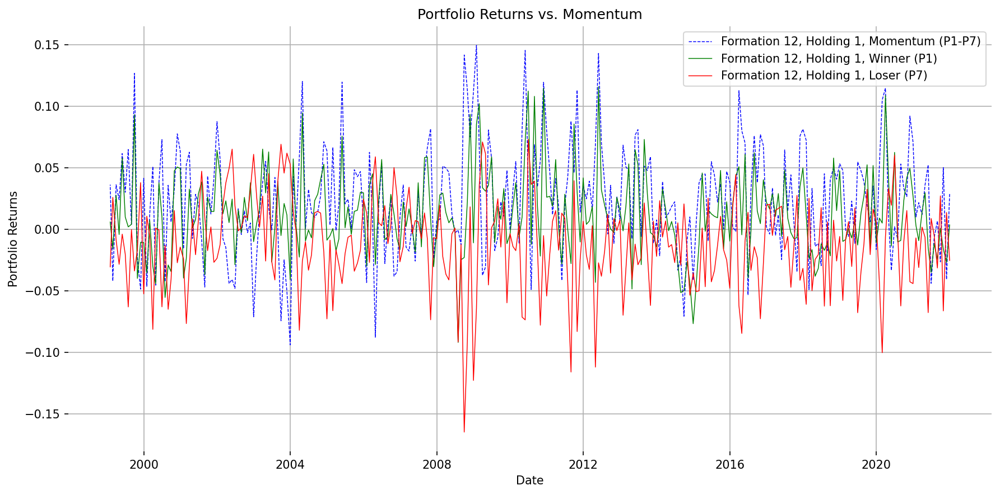

In [46]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)

plt.plot(momentum.index, momentum['Momentum_Formation_12_Holding_1'], label='Formation 12, Holding 1, Momentum (P1-P7)', color='blue', linestyle='dashed', linewidth=0.7)
plt.plot(portfolio_12_1.index, portfolio_12_1['Portfolio_1'], label='Formation 12, Holding 1, Winner (P1)', color='green', linewidth=0.7)
plt.plot(portfolio_12_1.index, portfolio_12_1['Portfolio_7'], label='Formation 12, Holding 1, Loser (P7)', color='red', linewidth=0.7)

plt.title('Portfolio Returns vs. Momentum')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.box(False)
plt.tight_layout()
plt.show()

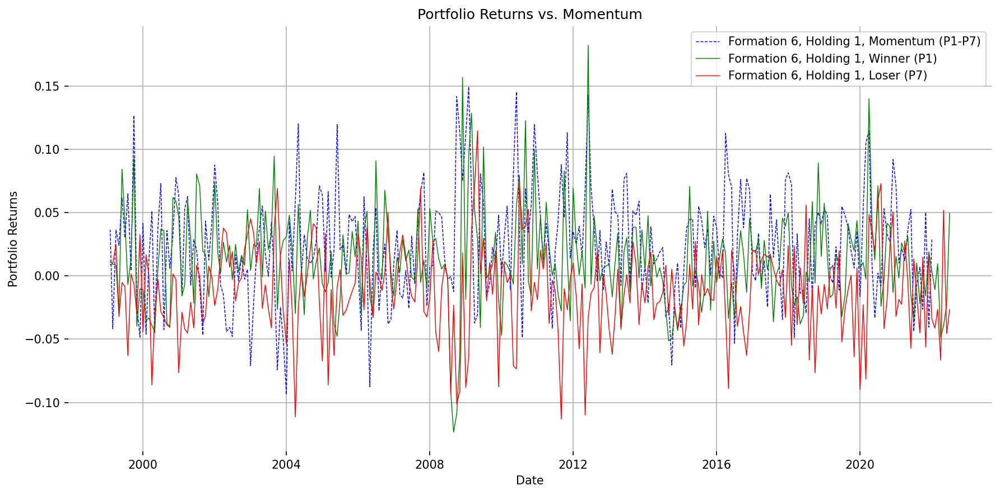

In [47]:
# Code
# Plotting portfolio returns
plt.figure(figsize=(12, 6), dpi=150)

plt.plot(momentum.index, momentum['Momentum_Formation_12_Holding_1'], label='Formation 6, Holding 1, Momentum (P1-P7)', color='blue', linestyle='dashed', linewidth=0.7)
plt.plot(portfolio_6_1.index, portfolio_6_1['Portfolio_1'], label='Formation 6, Holding 1, Winner (P1)', color='green', linewidth=0.7)
plt.plot(portfolio_6_1.index, portfolio_6_1['Portfolio_7'], label='Formation 6, Holding 1, Loser (P7)', color='red', linewidth=0.7)

plt.title('Portfolio Returns vs. Momentum')
plt.xlabel('Date')
plt.ylabel('Portfolio Returns')
plt.legend()
plt.grid(True)
plt.box(False)
plt.tight_layout()
plt.show()

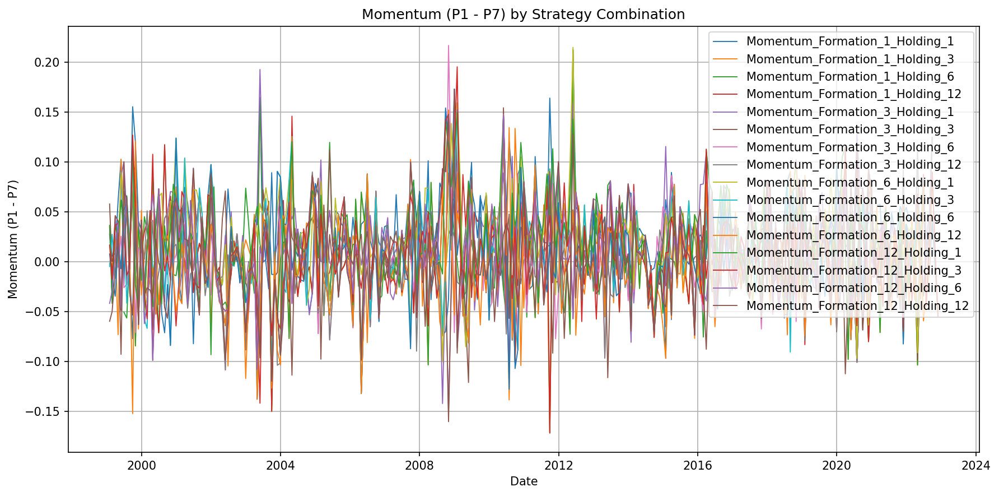

In [48]:
# Code
# Plotting the momentum data
plt.figure(figsize=(12, 6), dpi=150)
for column in momentum.columns:
    plt.plot(momentum.index, momentum[column], label=column,linewidth=0.9)

plt.title('Momentum (P1 - P7) by Strategy Combination')
plt.xlabel('Date')
plt.ylabel('Momentum (P1 - P7)')
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()

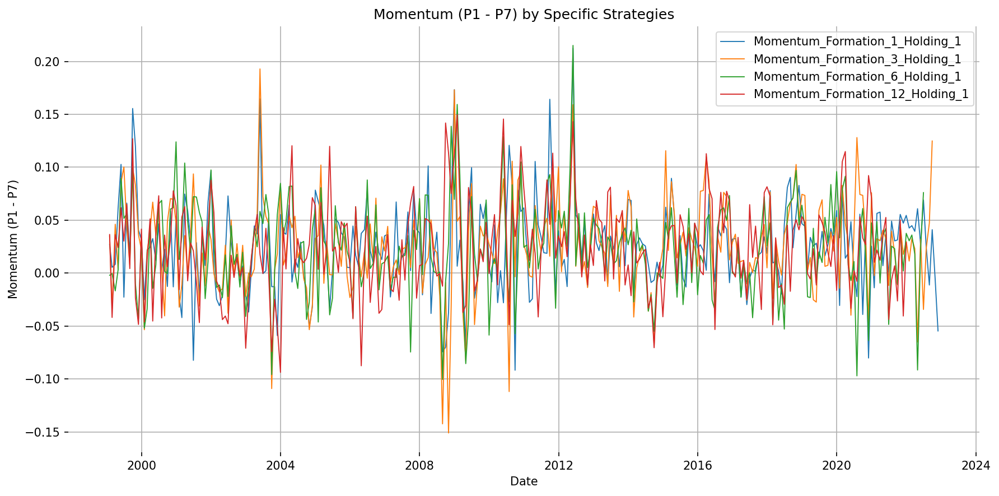

In [49]:
# Code
columns_to_plot = ['Momentum_Formation_1_Holding_1','Momentum_Formation_3_Holding_1','Momentum_Formation_6_Holding_1','Momentum_Formation_12_Holding_1']

# Plotting specific columns from the momentum dataframe
plt.figure(figsize=(12, 6), dpi=150)
for column in columns_to_plot:
    plt.plot(momentum.index, momentum[column], label=column,linewidth=0.9)

plt.title('Momentum (P1 - P7) by Specific Strategies')
plt.xlabel('Date')
plt.ylabel('Momentum (P1 - P7)')
plt.legend(loc='upper right')
plt.grid(True)
plt.box(False)
plt.tight_layout()
plt.show()

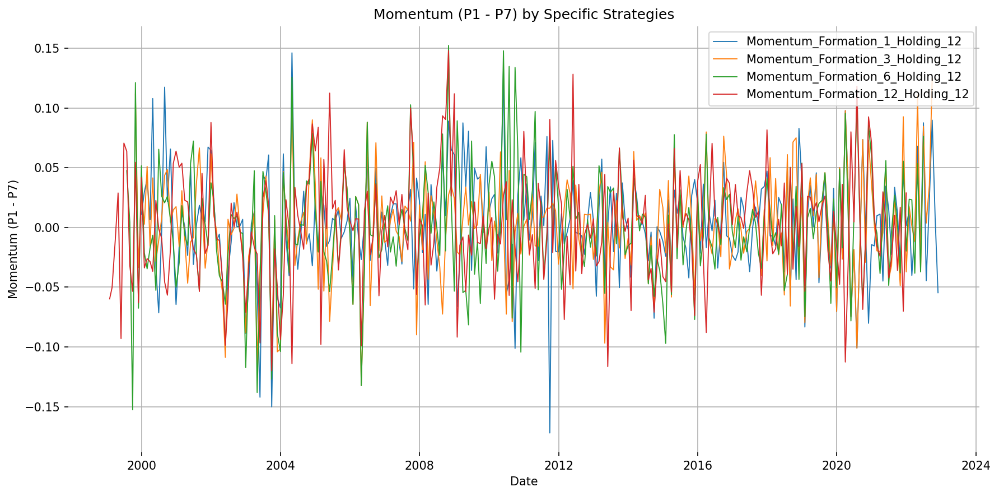

In [50]:
# Code
columns_to_plot = [
                   'Momentum_Formation_1_Holding_12','Momentum_Formation_3_Holding_12','Momentum_Formation_6_Holding_12','Momentum_Formation_12_Holding_12']

# Plotting specific columns from the momentum dataframe
plt.figure(figsize=(12, 6), dpi=150)
for column in columns_to_plot:
    plt.plot(momentum.index, momentum[column], label=column,linewidth=0.9)

plt.title('Momentum (P1 - P7) by Specific Strategies')
plt.xlabel('Date')
plt.ylabel('Momentum (P1 - P7)')
plt.legend(loc='upper right')
plt.grid(True)
plt.box(False)
plt.tight_layout()
plt.show()

## OLS Regression

Regressing the Fama French Factors on the  different strategies / portfolios   
=> Finding out if Fama French Factors have any power in explaining the portfolios returns

In [51]:
# Merge Fama_French and strategy_avg_at_date_df on the date index
merged_data = pd.merge(Fama_French, strategy_avg_at_date_df, left_index=True, right_index=True)

# List to store regression results for each strategy
results_summary = []

# Iterate over each strategy column
for strategy in strategy_avg_at_date_df.columns:
    # Filter out rows where the strategy returns are NaN
    data = merged_data[['Excess Return on the Market', 'Small-Minus-Big Return', 'High-Minus-Low Return', strategy]].dropna()
    
    # Prepare independent variables (Fama-French factors)
    X = data[['Excess Return on the Market', 'Small-Minus-Big Return', 'High-Minus-Low Return']]
    
    # Prepare dependent variable (strategy returns)
    Y = data[strategy]
    
    # Add a constant to the independent variables (Fama-French factors)
    X = sm.add_constant(X)
    
    # Run OLS regression
    model = sm.OLS(Y, X)
    results = model.fit()
    


# Iterate through results_summary and format the data for the table
    # Store the results in a dictionary
    results_dict = {
        'Strategy': strategy,
        'Coefficients': results.params,
        'Std_Errors': results.bse,  # Standard errors of coefficients
        'T-values': results.tvalues,  # t-values
        'P-values': results.pvalues,  # p-values
        'R-squared': results.rsquared
    }
    
    # Append results to the summary list
    results_summary.append(results_dict)

# Create a list of lists to store results for the main table (coefficients, t-values, and R-squared)
table_data = []

# Create a list of lists to store results for the t-values table
table_data_tvalues =[]

# Create a list of lists to store results for the p-values table
table_data_pvalues = []

# Iterate through results_summary and format the data for the main table and p-values table
for result in results_summary:
    strategy_name = result['Strategy']
    coefficients = result['Coefficients']
    t_values = result['T-values']
    p_values = result['P-values']
    r_squared = result['R-squared']
    
    # Format coefficients, t-values, and p-values for display
    coeff_list = [f"{coeff:.4f}" for coeff in coefficients]
    t_values_list = [f"{t:.4f}" for t in t_values]
    p_values_list = [f"{p:.4f}" for p in p_values]
    
    # Append strategy name, coefficients, t-values, and R-squared to table_data
    table_data.append([strategy_name] + coeff_list + [f"{r_squared:.4f}"])

     # Append strategy name and p-values to table_data_pvalues
    table_data_tvalues.append([strategy_name] + t_values_list)
    
    # Append strategy name and p-values to table_data_pvalues
    table_data_pvalues.append([strategy_name] + p_values_list)

# Define headers for the main table (coefficients, t-values, and R-squared)
headers_main = ['Strategy', 'Intercept', 'Excess Return on the Market', 
                'Small-Minus-Big Return', 'High-Minus-Low Return', 
                'R-squared']

# Dfine headers for the t-values table
# Define headers for the p-values table
headers_tvalues = ['Strategy','Intercept_t', 'Excess Return on the Market_t', 
                'Small-Minus-Big Return_t', 'High-Minus-Low Return_t']

# Define headers for the p-values table
headers_pvalues = ['Strategy', 'Intercept_p', 'Excess Return on the Market_p', 
                   'Small-Minus-Big Return_p', 'High-Minus-Low Return_p', ]

# Print the main table using tabulate
print("Main Table:")
print(tabulate(table_data, headers=headers_main, tablefmt='pretty'))

# Print the t-values  table using tabulate
print("Main Table:")
print(tabulate(table_data_tvalues, headers=headers_tvalues, tablefmt='pretty'))

# Print the p-values table using tabulate
print("\nP-values Table:")
print(tabulate(table_data_pvalues, headers=headers_pvalues, tablefmt='pretty'))

Main Table:
+-------------------------+-----------+-----------------------------+------------------------+-----------------------+-----------+
|        Strategy         | Intercept | Excess Return on the Market | Small-Minus-Big Return | High-Minus-Low Return | R-squared |
+-------------------------+-----------+-----------------------------+------------------------+-----------------------+-----------+
|  Formation_1_Holding_1  |  0.0008   |           -0.1518           |         0.0274         |        -0.0454        |  0.0909   |
|  Formation_1_Holding_3  |  0.0008   |           -0.1518           |         0.0274         |        -0.0454        |  0.0909   |
|  Formation_1_Holding_6  |  0.0008   |           -0.1518           |         0.0274         |        -0.0454        |  0.0909   |
| Formation_1_Holding_12  |  0.0009   |           -0.1508           |         0.0197         |        -0.0452        |  0.0901   |
|  Formation_3_Holding_1  |  0.0007   |           -0.1591           |  

 Regressing the Fama French Factors including the calculated momentum factor on the  different strategies / portfolios   
=> Finding out if Fama French Factors have any power in explaining the portfolios returns

In [52]:
# List to store regression results for each strategy
results_summary = []

# Iterate over each strategy column
for strategy in strategy_avg_at_date_df.columns:
    # Check if momentum data for the current strategy exists
    momentum_col = f'Momentum_{strategy}'
    if momentum_col not in momentum.columns:
        print(f"No momentum data available for strategy '{strategy}'. Skipping regression.")
        continue
    
    # Merge Fama_French with strategy-specific momentum data
    fama_french_with_momentum = pd.merge(Fama_French, momentum[[momentum_col]], left_index=True, right_index=True)
    
    # Merge fama_french_with_momentum with strategy_avg_at_date_df on the date index
    merged_data = pd.merge(fama_french_with_momentum, strategy_avg_at_date_df[[strategy]], left_index=True, right_index=True)
    
    # Check if merged_data is empty after merging
    if merged_data.empty:
        print(f"No data available for strategy '{strategy}'. Skipping regression.")
        continue
    
    # Prepare independent variables (Fama-French factors + strategy-specific momentum)
    X = merged_data[['Excess Return on the Market', 'Small-Minus-Big Return', 'High-Minus-Low Return', momentum_col]]
    
    # Prepare dependent variable (strategy returns)
    Y = merged_data[strategy]
    
    # Convert X and Y to numeric if needed
    X = X.apply(pd.to_numeric, errors='coerce')
    Y = pd.to_numeric(Y, errors='coerce')
    
    # Drop rows with any NaN values
    data = pd.concat([X, Y], axis=1).dropna()
    X = data[['Excess Return on the Market', 'Small-Minus-Big Return', 'High-Minus-Low Return', momentum_col]]
    Y = data[strategy]
    
    # Add a constant to the independent variables (Fama-French factors + momentum)
    X = sm.add_constant(X)
    
    # Run OLS regression
    model = sm.OLS(Y, X)
    results = model.fit()
    
    # Store the results in a dictionary
    results_dict = {
        'Strategy': strategy,
        'Coefficients': results.params,
        'Std_Errors': results.bse,  # Standard errors of coefficients
        'T-values': results.tvalues,  # t-values
        'P-values': results.pvalues,  # p-values
        'R-squared': results.rsquared
    }
    
    # Append results to the summary list
    results_summary.append(results_dict)

# Create a list of lists to store results for the main table (coefficients, t-values, and R-squared)
table_data = []

# Create a list of lists to store results for the t-values table
table_data_tvalues =[]

# Create a list of lists to store results for the p-values table
table_data_pvalues = []

# Iterate through results_summary and format the data for the main table and p-values table
for result in results_summary:
    strategy_name = result['Strategy']
    coefficients = result['Coefficients']
    t_values = result['T-values']
    p_values = result['P-values']
    r_squared = result['R-squared']
    
    # Format coefficients, t-values, and p-values for display
    coeff_list = [f"{coeff:.4f}" for coeff in coefficients]
    t_values_list = [f"{t:.4f}" for t in t_values]
    p_values_list = [f"{p:.4f}" for p in p_values]
    
    # Append strategy name, coefficients, t-values, and R-squared to table_data
    table_data.append([strategy_name] + coeff_list + [f"{r_squared:.4f}"])

     # Append strategy name and p-values to table_data_pvalues
    table_data_tvalues.append([strategy_name] + t_values_list)
    
    # Append strategy name and p-values to table_data_pvalues
    table_data_pvalues.append([strategy_name] + p_values_list)

# Define headers for the main table (coefficients, t-values, and R-squared)
headers_main = ['Strategy', 'Intercept', 'Excess Return on the Market', 
                'Small-Minus-Big Return', 'High-Minus-Low Return', 'momentum', 
                'R-squared']

# Dfine headers for the t-values table
# Define headers for the p-values table
headers_tvalues = ['Strategy','Intercept_t', 'Excess Return on the Market_t', 
                'Small-Minus-Big Return_t', 'High-Minus-Low Return_t', 'momentum_t']

# Define headers for the p-values table
headers_pvalues = ['Strategy', 'Intercept_p', 'Excess Return on the Market_p', 
                   'Small-Minus-Big Return_p', 'High-Minus-Low Return_p', 'momentum_p']

# Print the main table using tabulate
print("Main Table:")
print(tabulate(table_data, headers=headers_main, tablefmt='pretty'))

# Print the t-values  table using tabulate
print("Main Table:")
print(tabulate(table_data_tvalues, headers=headers_tvalues, tablefmt='pretty'))

# Print the p-values table using tabulate
print("\nP-values Table:")
print(tabulate(table_data_pvalues, headers=headers_pvalues, tablefmt='pretty'))

Main Table:
+-------------------------+-----------+-----------------------------+------------------------+-----------------------+----------+-----------+
|        Strategy         | Intercept | Excess Return on the Market | Small-Minus-Big Return | High-Minus-Low Return | momentum | R-squared |
+-------------------------+-----------+-----------------------------+------------------------+-----------------------+----------+-----------+
|  Formation_1_Holding_1  |  0.0012   |           -0.1521           |         0.0250         |        -0.0476        | -0.0152  |  0.0916   |
|  Formation_1_Holding_3  |  0.0005   |           -0.1490           |         0.0299         |        -0.0410        |  0.0509  |  0.1015   |
|  Formation_1_Holding_6  |  0.0008   |           -0.1528           |         0.0277         |        -0.0451        | -0.0095  |  0.0912   |
| Formation_1_Holding_12  |  0.0009   |           -0.1500           |         0.0207         |        -0.0450        |  0.0121  |  0.090

Regressing current momentum on next periods momentum  (per strategy / Currency Portfolio)   
=> Finding out if the current momentum has any power of explaining the next periods momentum

In [53]:
# Calculate the next period's momentum
next_period_momentum = momentum.shift(-1)

# List to store regression results
results_list = []

# Loop over each strategy to perform the regression
for strategy in momentum.columns:
    # Define X (current momentum) and Y (next period's momentum)
    X = momentum[strategy].dropna()
    Y = next_period_momentum[strategy].dropna()

    # Align indices
    X, Y = X.align(Y, join='inner')

    # Ensure numeric and drop NaNs
    X = pd.to_numeric(X, errors='coerce')
    Y = pd.to_numeric(Y, errors='coerce')
    X, Y = X.align(Y, join='inner')  # Realign after coercion

    if not X.empty and not Y.empty:
        X_with_const = sm.add_constant(X)

        model = sm.OLS(Y, X_with_const)
        results = model.fit()

        # Extract results
        constant = results.params.get('const', None)
        beta = results.params.get(strategy, None)
        t_value = results.tvalues.get(strategy, None)
        p_value = results.pvalues.get(strategy, None)
        r_squared = results.rsquared

        results_list.append({
            'Strategy': strategy,
            'Constant': constant,
            'Beta': beta,
            't-value': t_value,
            'p-value': p_value,
            'R-squared': r_squared
        })

# Create DataFrame
regression_results = pd.DataFrame(results_list)

# Display regression results using tabulate
table_data_regression = []
for _, row in regression_results.iterrows():
    strategy = row['Strategy']
    constant = f"{row['Constant']:.4f}" if pd.notnull(row['Constant']) else '-'
    beta = f"{row['Beta']:.4f}" if pd.notnull(row['Beta']) else '-'
    t_value = f"{row['t-value']:.4f}" if pd.notnull(row['t-value']) else '-'
    p_value = f"{row['p-value']:.4f}" if pd.notnull(row['p-value']) else '-'
    r_squared = f"{row['R-squared']:.4f}" if pd.notnull(row['R-squared']) else '-'

    table_data_regression.append([strategy, constant, beta, t_value, p_value, r_squared])

headers_regression = ['Strategy', 'Constant', 'Beta', 't-value', 'p-value', 'R-squared']

# Print the table
print("\nRegression Results:")
print(tabulate(table_data_regression, headers=headers_regression, tablefmt='pretty'))


Regression Results:
+----------------------------------+----------+---------+---------+---------+-----------+
|             Strategy             | Constant |  Beta   | t-value | p-value | R-squared |
+----------------------------------+----------+---------+---------+---------+-----------+
|  Momentum_Formation_1_Holding_1  |  0.0226  | 0.1151  | 1.9664  | 0.0502  |  0.0134   |
|  Momentum_Formation_1_Holding_3  |  0.0072  | -0.2729 | -4.7778 | 0.0000  |  0.0749   |
|  Momentum_Formation_1_Holding_6  |  0.0049  | -0.2160 | -3.6966 | 0.0003  |  0.0467   |
| Momentum_Formation_1_Holding_12  |  0.0033  | -0.1122 | -1.8721 | 0.0623  |  0.0127   |
|  Momentum_Formation_3_Holding_1  |  0.0212  | 0.1642  | 2.8207  | 0.0051  |  0.0274   |
|  Momentum_Formation_3_Holding_3  |  0.0104  | -0.0143 | -0.2433 | 0.8079  |  0.0002   |
|  Momentum_Formation_3_Holding_6  |  0.0036  | -0.0812 | -1.3791 | 0.1690  |  0.0068   |
| Momentum_Formation_3_Holding_12  |  0.0013  | -0.1358 | -2.2730 | 0.0238  |  

### Empirical Results

#### Performance Summary
The momentum strategy exhibits:
- Positive average returns over the sample period,
- Higher performance for longer lookback horizons,
- Evidence of cross-sectional dispersion in currency returns.

---

#### Risk-Adjusted Performance
Performance is evaluated using:
- Mean returns,
- Volatility,
- Sharpe ratios.

These metrics allow comparison against a passive FX benchmark and help assess whether returns compensate for risk.


### Limitations & Extensions

While the results are encouraging, several limitations remain:
- Transaction costs and bid–ask spreads are not explicitly modeled.
- The strategy assumes frictionless rebalancing.
- No formal risk model (e.g. volatility targeting) is applied.

Potential extensions include:
- Incorporating transaction costs,
- Volatility scaling,
- Combining momentum with carry signals,
- Out-of-sample and sub-period analysis.


### Conclusion

This project demonstrates that FX momentum strategies can be systematically constructed using historical data and simple ranking techniques.

More importantly, it showcases a **complete quantitative research workflow**, from raw data to economic interpretation. The framework can be easily extended to other asset classes or enhanced with additional signals and risk controls.
